<a href="https://colab.research.google.com/github/sprieton/AutoEncoder_evaluation_MINST/blob/main/GP_withGPy_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gaussian Processes with GPY

------------------------------------------------------
*Machine Learning Course*

*Master in Information & Health Engineering*

*Vanessa Gómez Verdejo vanessa@tsc.uc3m.es and Pablo M. Olmos olmos@tsc.uc3m.es*

------------------------------------------------------



# Advanced Concepts of Gaussian Processes

The aim of this notebook is to introduce some additional features or extensions to the GP formulation that will be very useful when working with real problems.

To use these features we will use one of the most common library for GP design, [GPy](https://gpy.readthedocs.io/en/latest/#) (this time we will not use sklearn).

We will start this notebook with a brief description of this library and we will introduce step by step the functionalities it provides along with the different GP extensions.

# 1. Introduction to Gaussian Processes in GPy

[GPy](https://sheffieldml.github.io/GPy/) is a Gaussian Processes (GP) library coded in Python by the machine learning group at the University of Sheffield.  Documentation for GPy is available at the [SheffieldML github page](https://github.com/SheffieldML/GPy) or at [this page](http://gpy.readthedocs.org/en/latest/).



In [1]:
# You can install GPy using the following command
!pip install GPy

In [2]:
import GPy
import numpy as np
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'   ##QUALITY FIGURES!!
plt.rcParams["figure.figsize"] = [8,8]

## 1.1 Generating the data: One-dimensional regression example.

To get started, let's generate a data set using the function:

$$f(x) = -cos(2\pi x )+sin(4\pi x )$$

we vary $x$ in the interval $[0, 1]$ and add some noise in the generation of the labels or *targets*:

$$y(x) = f(x) + \epsilon,$$

where the noise follows a Gaussian distribution $\epsilon \sim \mathcal{N}(0, 0.01)$.


(-1.0, 1.0)

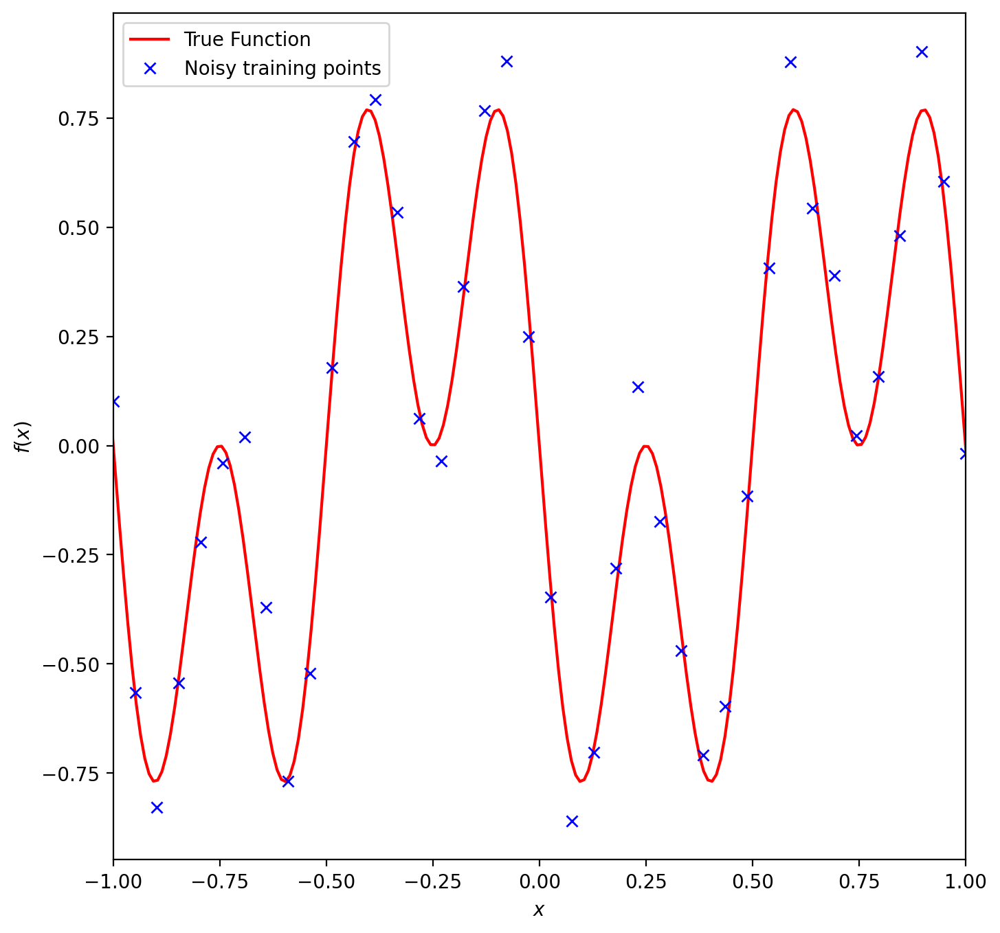

In [3]:
npoints = 40
X = np.linspace(-1,1,npoints)[:,None]
Y = -np.cos(2*np.pi*X)* + np.sin(4*np.pi*X) + np.random.randn(npoints,1) * np.sqrt(0.01)

X_true = np.linspace(-5, 5, 1000)[:,None]
Y_true = -np.cos(2*np.pi*X_true)* + np.sin(4*np.pi*X_true)

plt.figure()
plt.plot(X_true,Y_true,'r')
plt.plot(X,Y,'bx',ms=6)
plt.legend(['True Function','Noisy training points'])
plt.xlabel('$x$')
plt.ylabel('$f(x)$')
plt.xlim([-1,1])

## 1.2 Starting to use GPy

To use, define and train a GP in GPy we have to follow these steps:


**1. Select the kernel or covariance matrix**.

The first step is to define the kernel or covariance function we want to use for the model. In this case, we choose a kernel based on the Gaussian kernel (i.e., RBF or squared exponential):

\begin{align}
k(\mathbf{x},\mathbf{x}^*) = \sigma^2 \exp \left(- \frac{||\mathbf{x}-\mathbf{x}^*||^2}{2 \ell^2}\right),
\end{align}

where $\sigma^2$ and $\ell^2$ are the kernel hyperparameters (`variance` and `lengthscale`). Note that the definition of this kernel has two parameters!

The definition or initialization of these parameters is optional (they will actually be learned by maximizing the evidence or marginal likelihood of the model), and their default (initial) values are 1.

Moreover, in the kernel definition it is not necessary to include the noise (this library already includes it in the model outside the kernel).


In [7]:
# Define the kernel o covariance. Here the model noise has NOT to be included (by default, it is modelled apart)
kernel = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=1)

## Lo unico que es obligatorio definir aqui es el input_dim, los otros parámetros son parámetros de inicialización pero no es obligario iniciañizarlos.

**2. Defining the GP**

To define the model we will use the class `GPy.models.GPRegression` whose inputs are the observations and the kernel. Note that despite passing the observations to this function, this method only initializes the object, it does not learn the model parameters (we will do that later).

It is in this definition that, by default, the noise (which is initialized with a variance equal to 1) is added to the model.

In [5]:
# Define the model: you need to include the model parameters (at least the kernel) togheter to training data!!!
m = GPy.models.GPRegression(X,Y,kernel) ## distinto: En la definición hay que incluir los datos de entrenamiento

We can display the model parameters with the `display` function.

In [9]:
from IPython.display import display
display(m)
#You can also type print(m), but is not that nicely formatted


GP_regression.,value,constraints,priors
rbf.variance,1.0,+ve,
rbf.lengthscale,1.0,+ve,
Gaussian_noise.variance,1.0,+ve,


Now, we are going to represent the predictive distribution (note that we have not fitted the model yet!).

In [10]:
def plot_gp_model(m, plot_density=True, plot_data=True, plot_inducing=False, plot_limits=None, resolution=100, ax=None, **kwargs):
    """
    Custom plotting function for GPy models compatible with recent matplotlib versions.

    Args:
        m (GPy.models.GPRegression): The GPy regression model to plot.
        plot_density (bool): Whether to plot the confidence density.
        plot_data (bool): Whether to plot the training data.
        plot_inducing (bool): Whether to plot the inducing points (if applicable).
        plot_limits (tuple): Tuple of (xmin, xmax) for the plot limits.
        resolution (int): Number of points to use for plotting the function.
        ax (matplotlib.axes.Axes): The axes to plot on. If None, a new figure and axes are created.
        **kwargs: Additional keyword arguments to pass to matplotlib plot functions.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 8))
        show_plot = True
    else:
        fig = ax.figure
        show_plot = False


    # Determine plot limits
    if plot_limits is None:
        xmin, xmax = m.X.min(), m.X.max()
        x_plot = np.linspace(xmin, xmax, resolution)[:, None]
    else:
        xmin, xmax = plot_limits
        x_plot = np.linspace(xmin, xmax, resolution)[:, None]


    # Get predictive mean and variance
    mean, variance = m.predict(x_plot)
    std_dev = np.sqrt(variance)

    # Plot the mean
    ax.plot(x_plot, mean, label='GP mean', **kwargs)

    # Plot the confidence density (2 standard deviations)
    if plot_density:
        lower_bound = mean - 2 * std_dev
        upper_bound = mean + 2 * std_dev
        ax.fill_between(x_plot[:, 0], lower_bound[:, 0], upper_bound[:, 0], color='blue', alpha=0.2, label='95% confidence')

    # Plot training data
    if plot_data:
        ax.plot(m.X, m.Y, 'bx', ms=6, label='Train Data')

    # Plot inducing points (if applicable and requested)
    if plot_inducing and hasattr(m, 'inducing_inputs'):
        ax.plot(m.inducing_inputs, m.predict(m.inducing_inputs)[0], 'go', ms=8, label='Inducing Points')


    ax.set_xlabel('$x$')
    ax.set_ylabel('$f(x)$')
    ax.set_xlim(xmin, xmax)
    ax.legend()

    if show_plot:
        plt.show()

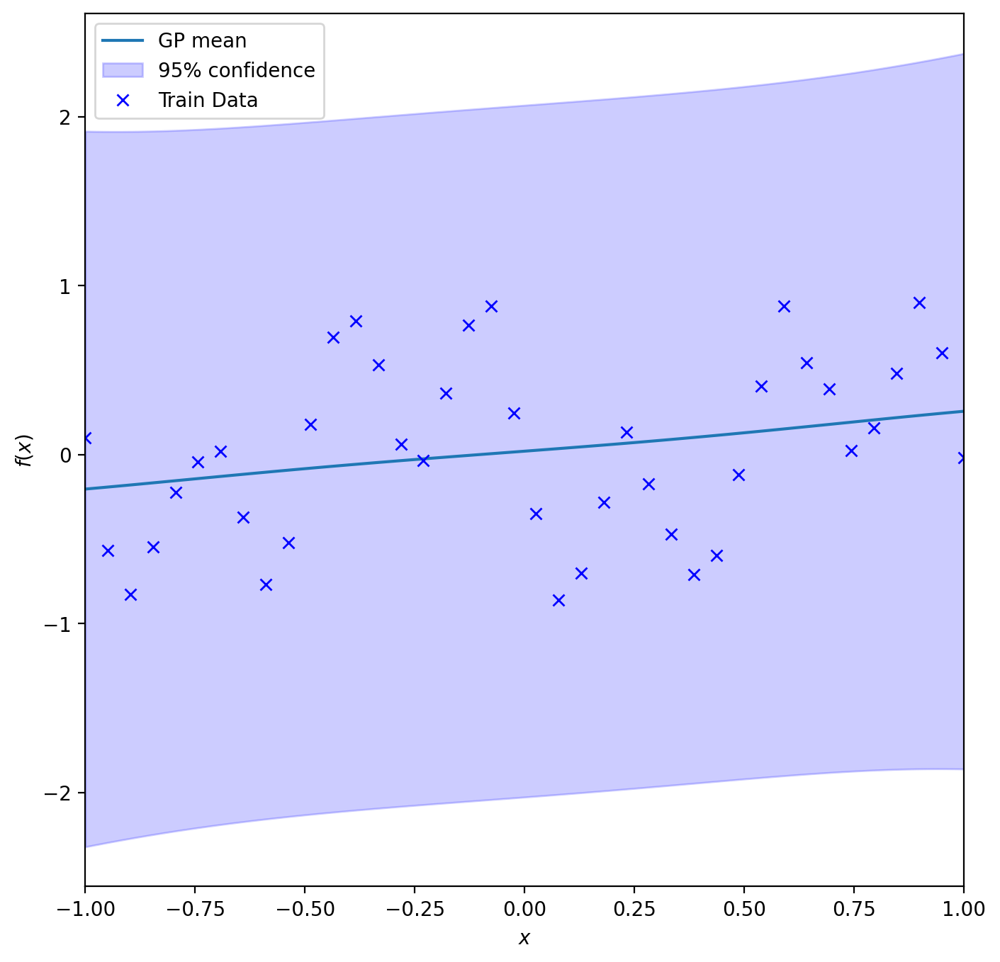

In [11]:
#fig = m.plot(plot_density=True)
plot_gp_model(m, plot_density=True)

The cell above shows our GP regression model **before parameter optimization**. The shaded region corresponds to the ~95% confidence intervals (i.e., +/- 2 standard deviations).

**3. Learning the GP parameters**

The default values of the kernel and noise parameters may not be optimal in this problem (in fact, the confidence intervals look too wide in the figure above). As we know these can be found by maximizing the marginal likelihood (also called evidence) of the data.

This can be done in GPy by invoking the `.optimize` method of the object:


In [12]:
m.optimize(messages=True) ## m es el GP model que se ha definido antes.
                          ## Objective es el valor de la función objetivo que queremos
                          ## optimizar la loss

If we want to perform some random initializations to try to improve the optimization result, we can use the `optimize_restarts` function. This randomly selects (from $\mathcal{N}(0,1)$) initializations for the parameter values, optimizes each, and sets the model to the best solution found.

*Note: the GPy optimizer minimizes cost functions, so in this case it changes sign of the objective function and we are actually minimizing the negative log marginal likelihood.*

In [ ]:
m.optimize_restarts(num_restarts = 10) ## Marginal likelihood, ese es el número que sale
display(m)

Optimization restart 1/10, f = 4.684352296273254
Optimization restart 2/10, f = 4.684352296248747
Optimization restart 3/10, f = 24.158829830306757
Optimization restart 4/10, f = 24.15882983011182
Optimization restart 5/10, f = 4.684352296245461
Optimization restart 6/10, f = 4.684352296247866
Optimization restart 7/10, f = 29.277763575537055
Optimization restart 8/10, f = 29.277764594073712
Optimization restart 9/10, f = 29.277756732202633
Optimization restart 10/10, f = 24.15882983011086


GP_regression.,value,constraints,priors
rbf.variance,0.3363743107477821,+ve,
rbf.lengthscale,0.09723804001219633,+ve,
Gaussian_noise.variance,0.01113077615173796,+ve,


Let's now represent the trained model

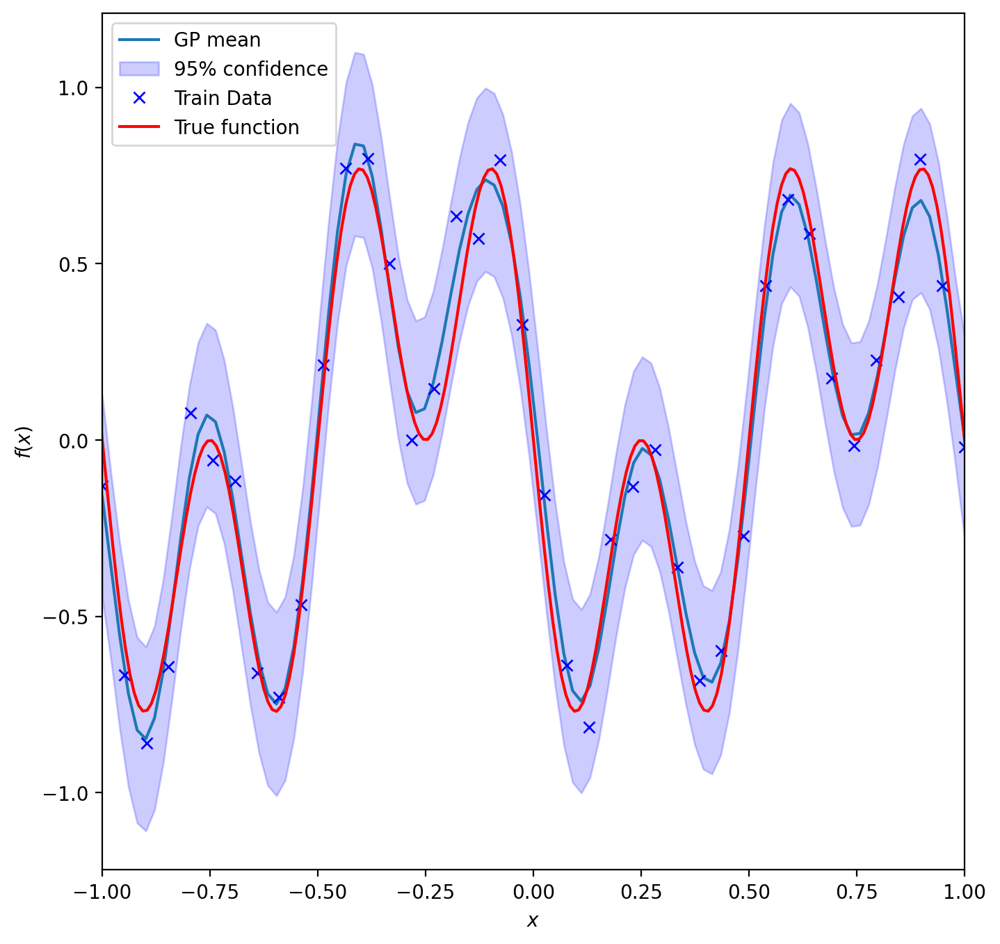

In [ ]:
#fig = m.plot(plot_density=True)
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m, plot_density=True, ax=ax)

ax.plot(X_true,Y_true,'r')
ax.set_xlim([-1,1])
plt.legend(['GP mean', '95% confidence', 'Train Data', 'True function'])

Now that we know how to define and train a model in GPy, let's take a look at some of the facilities provided by this library

# 2. Module for kernel definition

GPy includes a complete kernel module to define ad-hoc kernels for specific data modeling needs. For example:

* We can find common kernels, such as linear, RBF, polynomial, but also specific ones (truncated versions, periodic, ...).
* We can design kernels as a combination of others (sums, products, ...). And kernels include scaling factors (like the `variance` of the RBF kernel) to automatically learn the right combination of kernels.
* We can also define kernels that act on a subset of features that add flexibility to create new kernels.

Let's see these funcionalities in detail....

## 2.1 Defining and drawing the kernel

When defining the kernel, the only mandatory parameter is the input dimension (domain).  However, as we have seen, it is also possible to specify parameter values. For example, the following three commands are valid for defining an RBF kernel.

In [13]:
ker1 = GPy.kern.RBF(1)  # Equivalent to ker1 = GPy.kern.rbf(input_dim=1, variance=1., lengthscale=1.)
ker2 = GPy.kern.RBF(input_dim=1, variance = .75, lengthscale=2.)
ker3 = GPy.kern.RBF(1, .5, .5)


We can use the functions `print` (of Python) and `plot` (specific of these kernel objects) to analyze and represent the kernels we have just defined.

In [14]:
print(ker2)

  rbf.         |  value  |  constraints  |  priors
  variance     |   0.75  |      +ve      |        
  lengthscale  |    2.0  |      +ve      |        


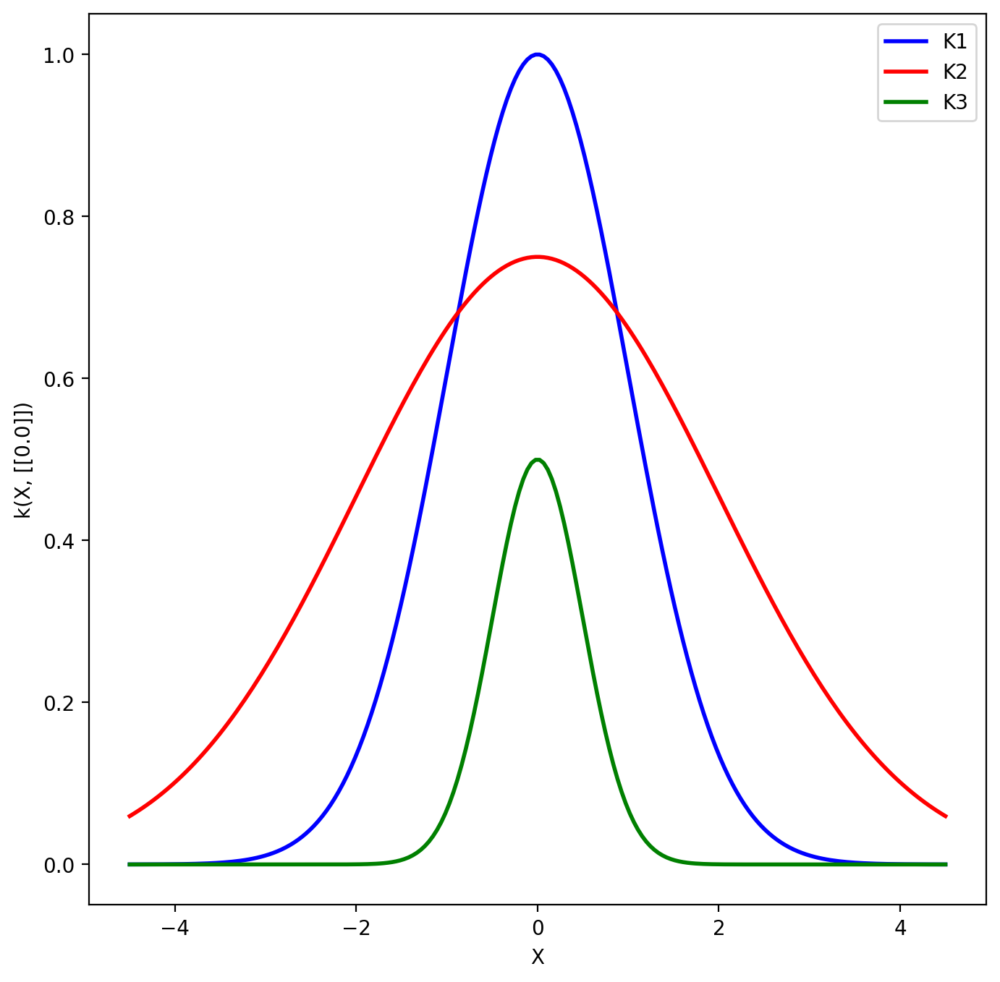

In [15]:
_ = ker1.plot(ax=plt.gca(), color='blue', label='K1')
_ = ker2.plot(ax=plt.gca(), color='red', label='K2')
_ = ker3.plot(ax=plt.gca(), color='green', label='K3')
plt.legend()

## 2.2 Kernels available in GPy

GPy integrates in its library a large collection of kernels. In the following code cell, we show a summary of some of them, but a complete list can be found by typing `GPy.kern.<tab>`:

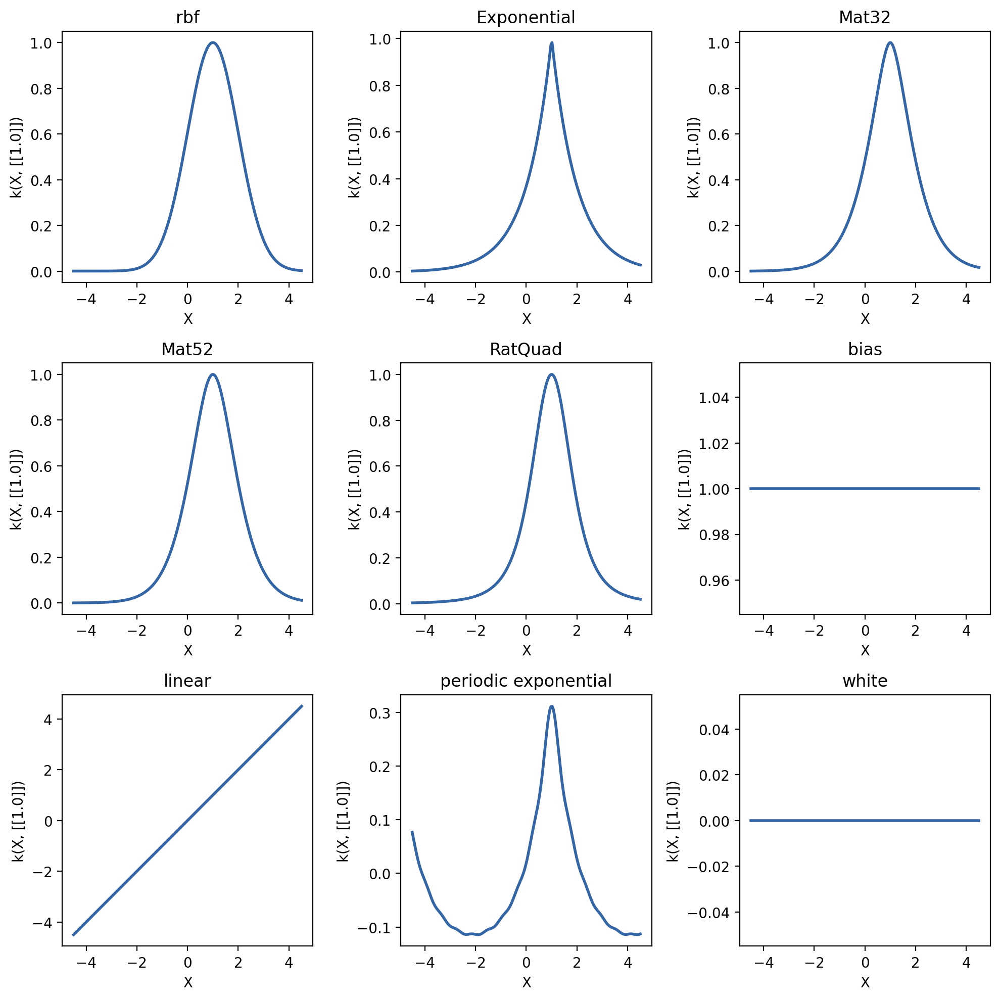

In [16]:
figure, axes = plt.subplots(3,3, figsize=(10,10), tight_layout=True)
kerns = [GPy.kern.RBF(1), GPy.kern.Exponential(1), GPy.kern.Matern32(1), GPy.kern.Matern52(1), GPy.kern.RatQuad(1), GPy.kern.Bias(1), GPy.kern.Linear(1), GPy.kern.PeriodicExponential(1), GPy.kern.White(1)]
for k,a in zip(kerns, axes.flatten()):
    k.plot(ax=a, x=1)
    a.set_title(k.name.replace('_', ' '))



Let's see in detail the properties and parameters of some of these kernels:

#### Linear Kernel

The linear kernel is simply the scalar product between the input data
\begin{align}
k(\mathbf{x},\mathbf{x}^*) = \sigma^2 \mathbf{x}^T\mathbf{x}^{*}
\end{align}

and includes an amplitude parameter called `variance`.

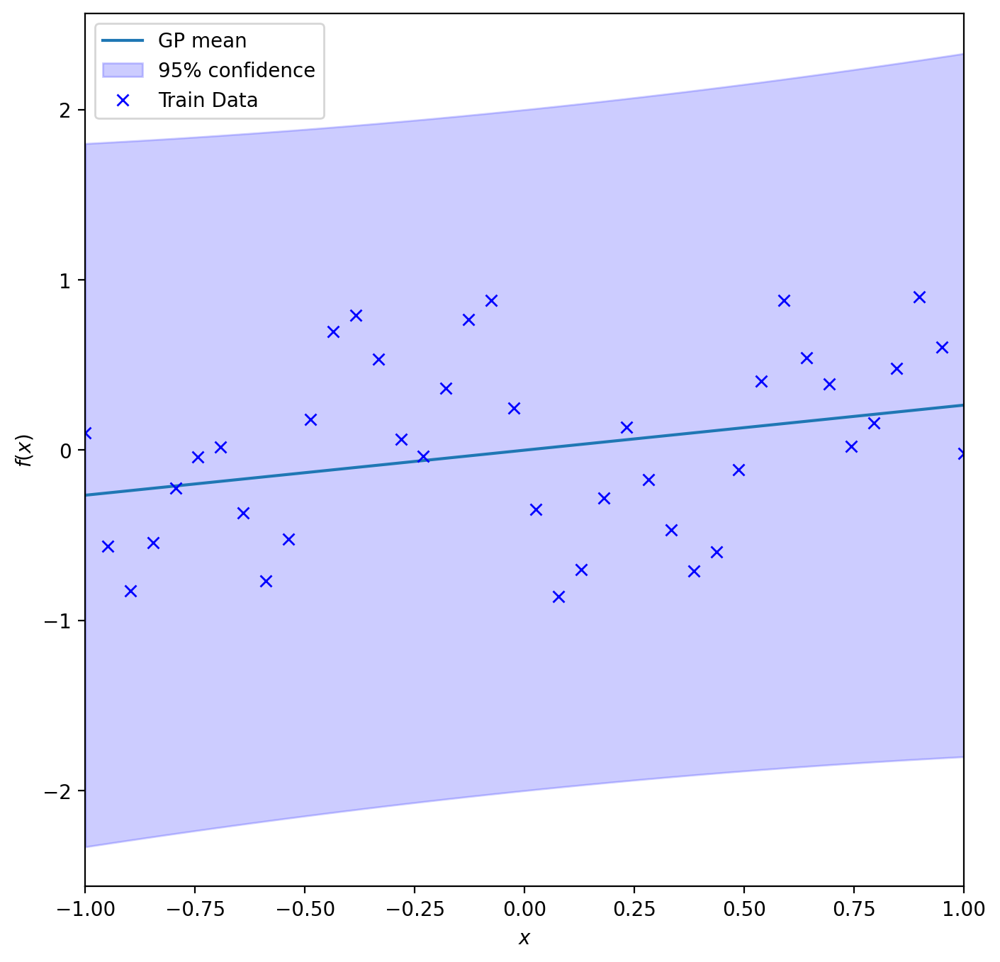

In [17]:
kernel = GPy.kern.Linear(input_dim=1)
m = GPy.models.GPRegression(X,Y,kernel)
#fig = m.plot(plot_density=True)
plot_gp_model(m, plot_density=True)


If we sample from the posterior, this kernel provides us with solutions of this type:

Optimization restart 1/10, f = 29.528464790462646
Optimization restart 2/10, f = 29.52846479044801
Optimization restart 3/10, f = 29.528464790450098
Optimization restart 4/10, f = 29.528464790507453
Optimization restart 5/10, f = 29.528464790448375
Optimization restart 6/10, f = 29.528464790450982
Optimization restart 7/10, f = 29.528464790447963
Optimization restart 8/10, f = 29.52846479049066
Optimization restart 9/10, f = 29.528464790610023
Optimization restart 10/10, f = 29.528464790448318


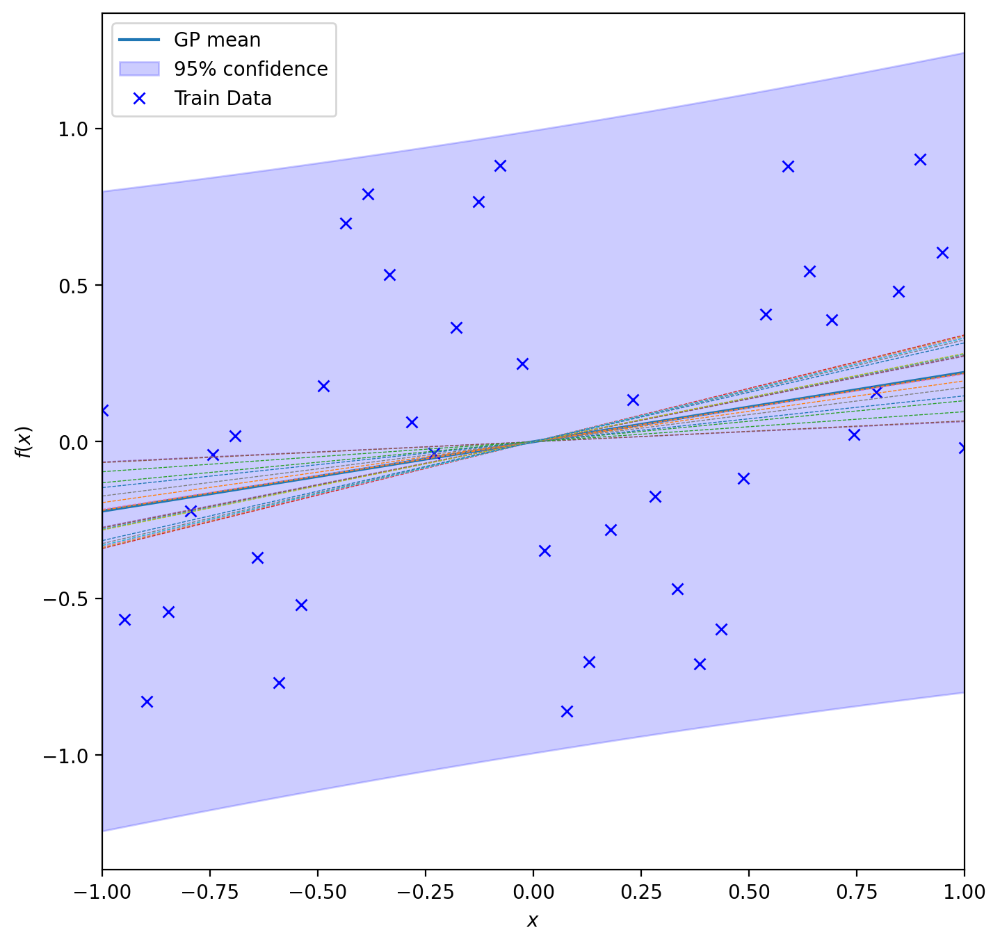

In [18]:
m.optimize_restarts(num_restarts = 10)
#fig = m.plot(plot_density=True)
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m, plot_density=True, ax=ax)

nsamples = 20
# Generate outputs of the model from the predictive distribution
posteriorYtest = m.posterior_samples_f(X, full_cov=True, size=nsamples)
ax.plot(X,posteriorYtest.reshape([-1,nsamples]),'--',lw=0.5,)
plt.show()

#### RBF Kernel

The RBF kernel is the one we already know, it is a stationary kernel and it is also known as "square exponential" kernel:
\begin{align}
k(\mathbf{x},\mathbf{x}^*) = \sigma^2 \exp \left(- \frac{||\mathbf{x}-\mathbf{x}^*||^2}{2 \ell^2}\right),
\end{align}

which as we have seen is parameterized by the lengthscale $\ell^2$ and the variance $\sigma^2$.

The prior and posterior of a GP resulting from an RBF kernel are shown in the following figure:

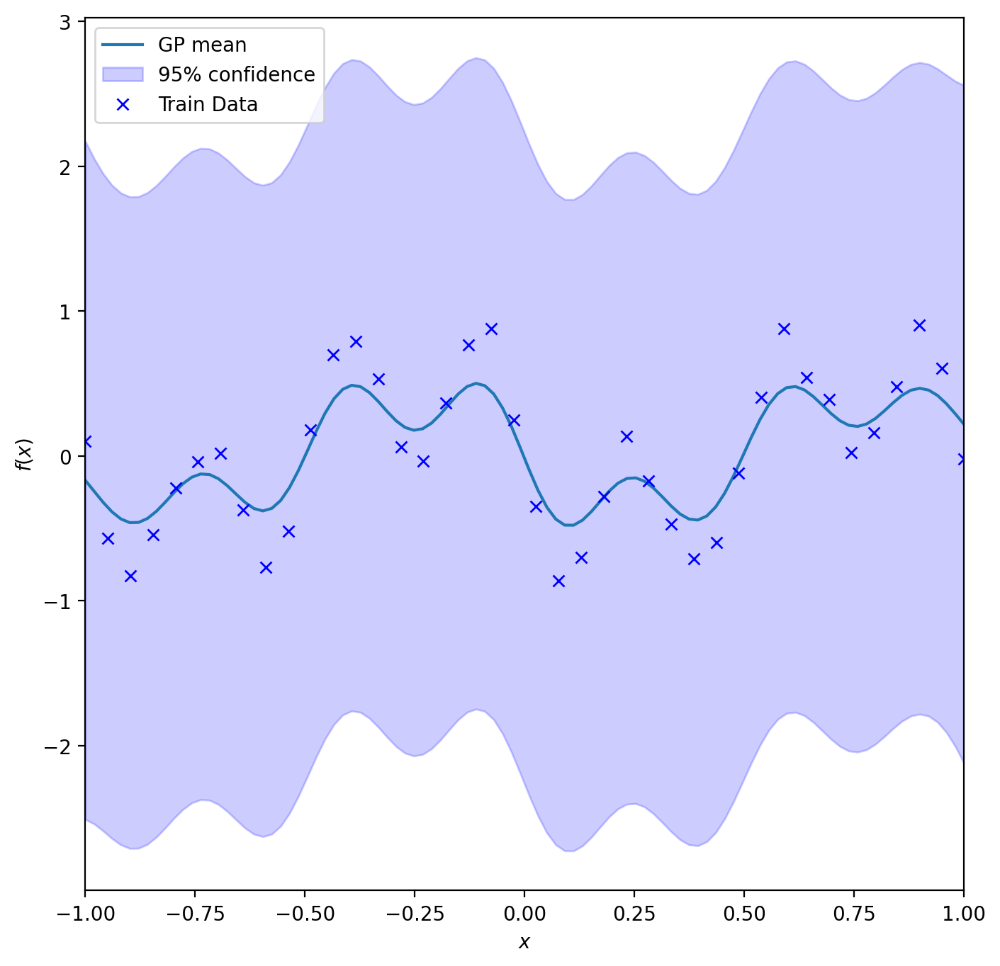

In [19]:
kernel = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=0.1)  # Try modify the lenghtscale
m = GPy.models.GPRegression(X,Y,kernel)
#fig = m.plot(plot_density=True)
plot_gp_model(m, plot_density=True)

Optimization restart 1/10, f = 0.2148460469241762
Optimization restart 2/10, f = 30.477131865330588
Optimization restart 3/10, f = 0.21484604692442133
Optimization restart 4/10, f = 30.477141185306703
Optimization restart 5/10, f = 26.34501739834766
Optimization restart 6/10, f = 30.477131891196706
Optimization restart 7/10, f = 30.47713203990832
Optimization restart 8/10, f = 30.47714010647316
Optimization restart 9/10, f = 30.477131808649524
Optimization restart 10/10, f = 0.2148460469240625


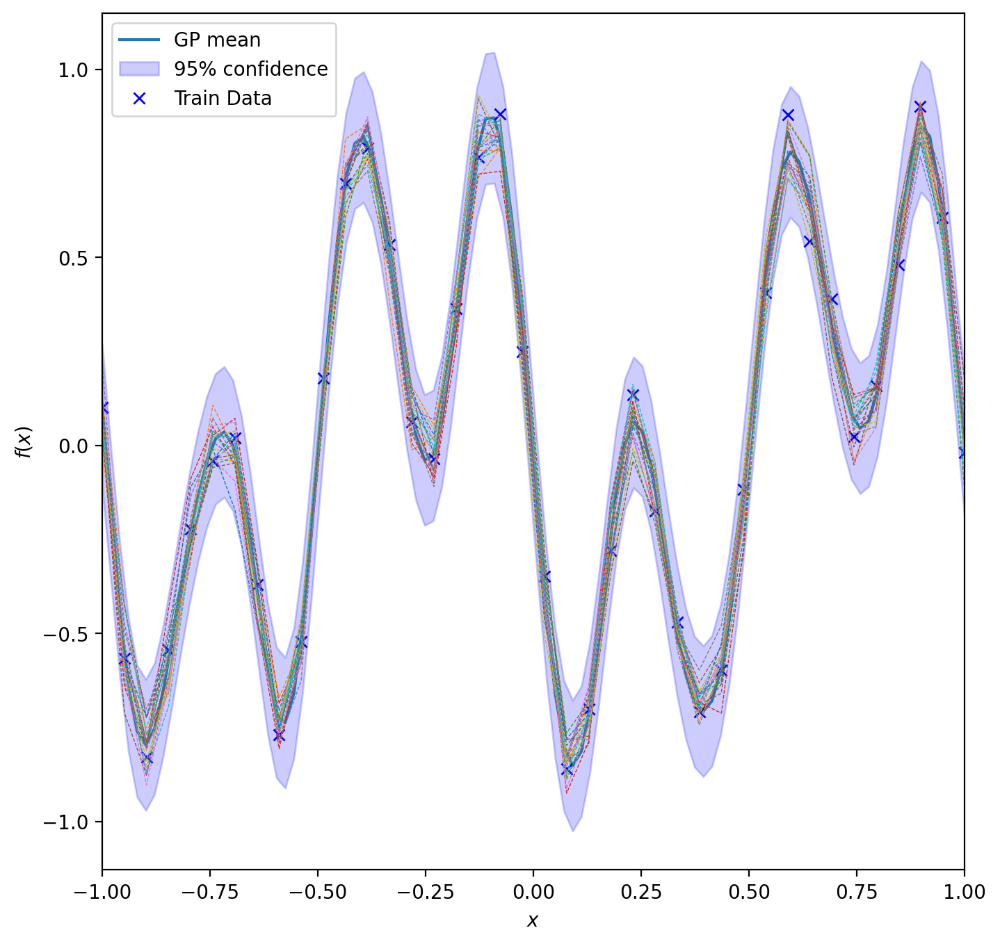

In [20]:
m.optimize_restarts(num_restarts = 10)
#fig = m.plot(plot_density=True)
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m, plot_density=True, ax=ax)
nsamples = 20
# Generate outputs of the model from the predictive distribution
posteriorYtest = m.posterior_samples_f(X, full_cov=True, size=nsamples)
ax.plot(X,posteriorYtest.reshape([-1,nsamples]),'--',lw=0.5,)
plt.show()

#### Matern Kernel

The Matern kernel is a stationary kernel and a generalization of the RBF kernel. It has an additional parameter to the Gaussian kernel, $\nu$, which controls the smoothness of the resulting function:


$$k\left(x_{i}, x_{j}\right)=\sigma^2 \frac{1}{\Gamma(\nu) 2^{\nu-1}}\left(\frac{\sqrt{2 \nu}}{l} d\left(x_{i}, x_{j}\right)\right)^{\nu} K_{\nu}\left(\frac{\sqrt{2 \nu}}{l} d\left(x_{i}, x_{j}\right)\right)$$

where $d$ is the Euclidean distance, $K_{\nu}$ is a modified Bessel function and $\Gamma$ is the gamma function. When  $\nu \rightarrow \infty $, the Matérn kernel becomes identical to the Gaussian kernel and when $\nu=1/2$ becomes the exponential kernel. GPy includes two particular and common cases of this kernel:



*  **Matern Kernel  32**
$$k\left(x_{i}, x_{j}\right)=\sigma^2 \left(1+\frac{\sqrt{3}}{l} d\left(x_{i}, x_{j}\right)\right) \exp \left(-\frac{\sqrt{3}}{l} d\left(x_{i}, x_{j}\right)\right) \quad \nu=\frac{3}{2}$$

*  **Matern Kernel  52**
$$k\left(x_{i}, x_{j}\right)=\sigma^2 \left(1+\frac{\sqrt{5}}{l} d\left(x_{i}, x_{j}\right)+\frac{5}{3 l} d\left(x_{i}, x_{j}\right)^{2}\right) \exp \left(-\frac{\sqrt{5}}{l} d\left(x_{i}, x_{j}\right)\right) \quad \nu=\frac{5}{2}$$

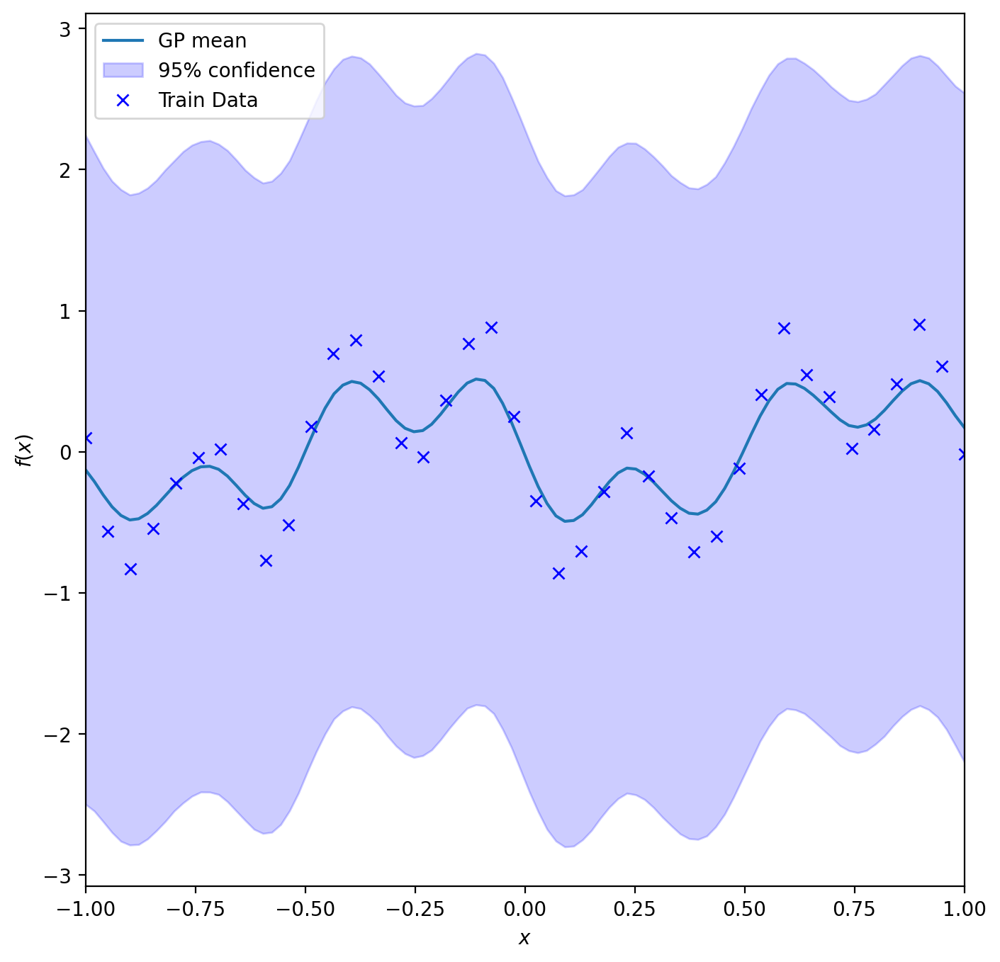

In [22]:
# esas definiciones son funciones que generalizan las kernels gaussianas. Es decir,
# rbf es una particularidad de esta definición. Suele funcionar mejor para ajustar a
# funciones complejas

kernel = GPy.kern.Matern32(input_dim=1, variance=1., lengthscale=0.1)
m = GPy.models.GPRegression(X,Y,kernel)
#fig = m.plot(plot_density=True)
plot_gp_model(m, plot_density=True)

Optimization restart 1/10, f = 6.547433787935763
Optimization restart 2/10, f = 6.547433755331802
Optimization restart 3/10, f = 6.54743527182692
Optimization restart 4/10, f = 6.547434966135988
Optimization restart 5/10, f = 6.54743387633053
Optimization restart 6/10, f = 6.547433757578048
Optimization restart 7/10, f = 6.547433793457746
Optimization restart 8/10, f = 6.547433761160235
Optimization restart 9/10, f = 6.547433759344159
Optimization restart 10/10, f = 6.547433845232149


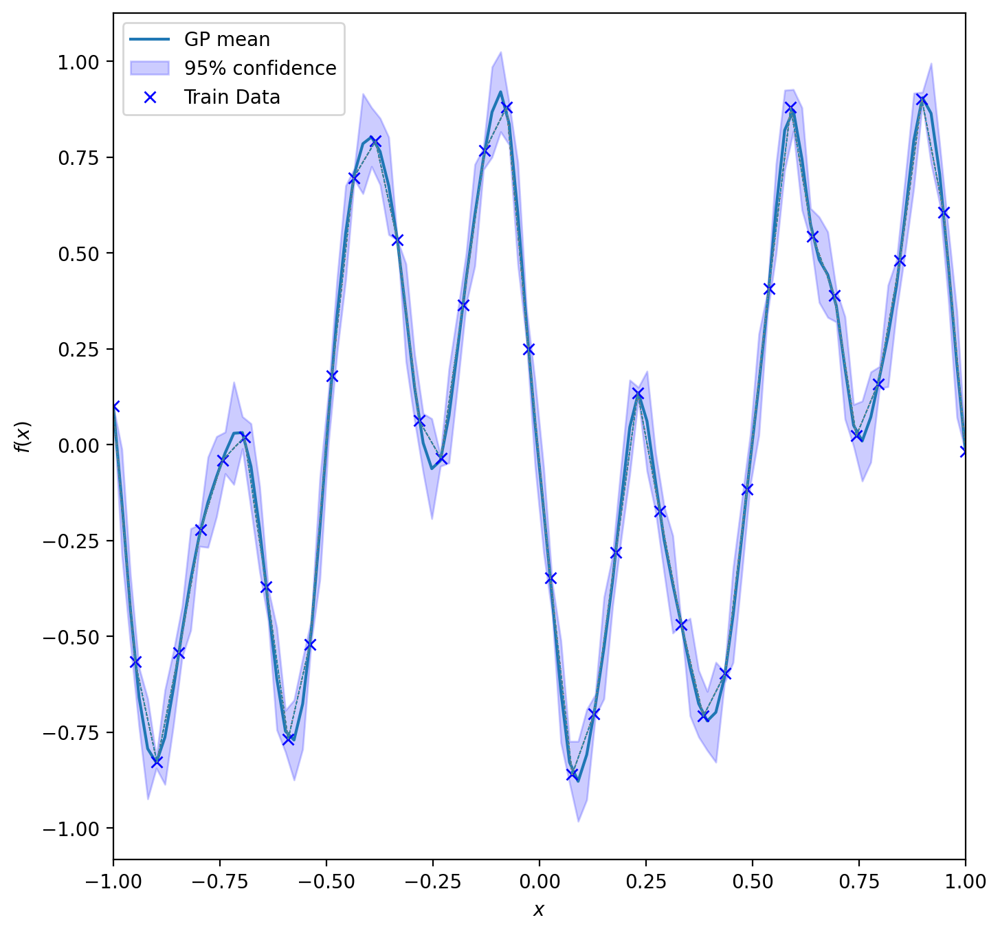

In [23]:
m.optimize_restarts(num_restarts = 10)
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m, plot_density=True, ax=ax)
nsamples = 20
# Generate outputs of the model from the predictive distribution
posteriorYtest = m.posterior_samples_f(X, full_cov=True, size=nsamples)
ax.plot(X,posteriorYtest.reshape([-1,nsamples]),'--',lw=0.5,)
plt.show()

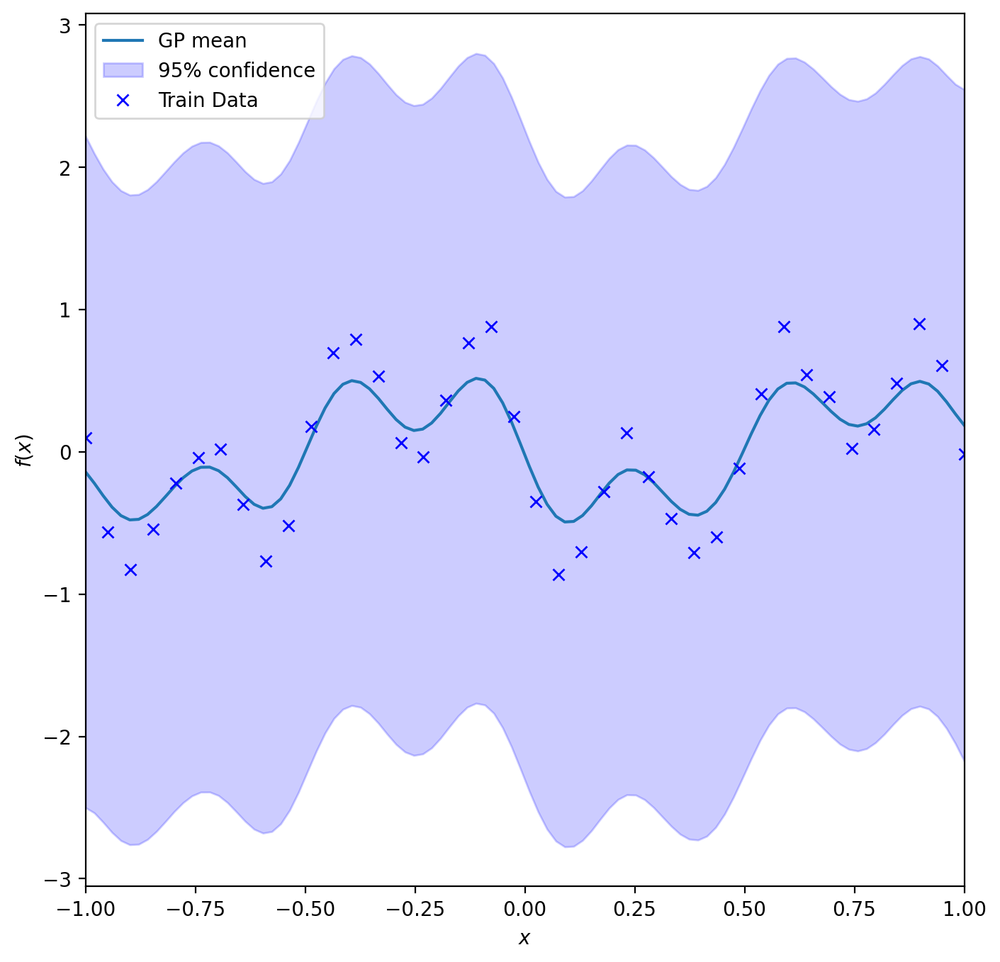

In [24]:
kernel = GPy.kern.Matern52(input_dim=1, variance=1., lengthscale=0.1)
m = GPy.models.GPRegression(X,Y,kernel)
#fig = m.plot(plot_density=True)
plot_gp_model(m, plot_density=True)

Optimization restart 1/10, f = 4.182326465577347
Optimization restart 2/10, f = 4.182326465566501
Optimization restart 3/10, f = 4.182326465566401
Optimization restart 4/10, f = 4.182326465567343
Optimization restart 5/10, f = 4.182326465566991
Optimization restart 6/10, f = 4.182326465802692
Optimization restart 7/10, f = 4.182326465567051
Optimization restart 8/10, f = 4.182326465567879
Optimization restart 9/10, f = 4.182326465566426
Optimization restart 10/10, f = 4.18232646556724


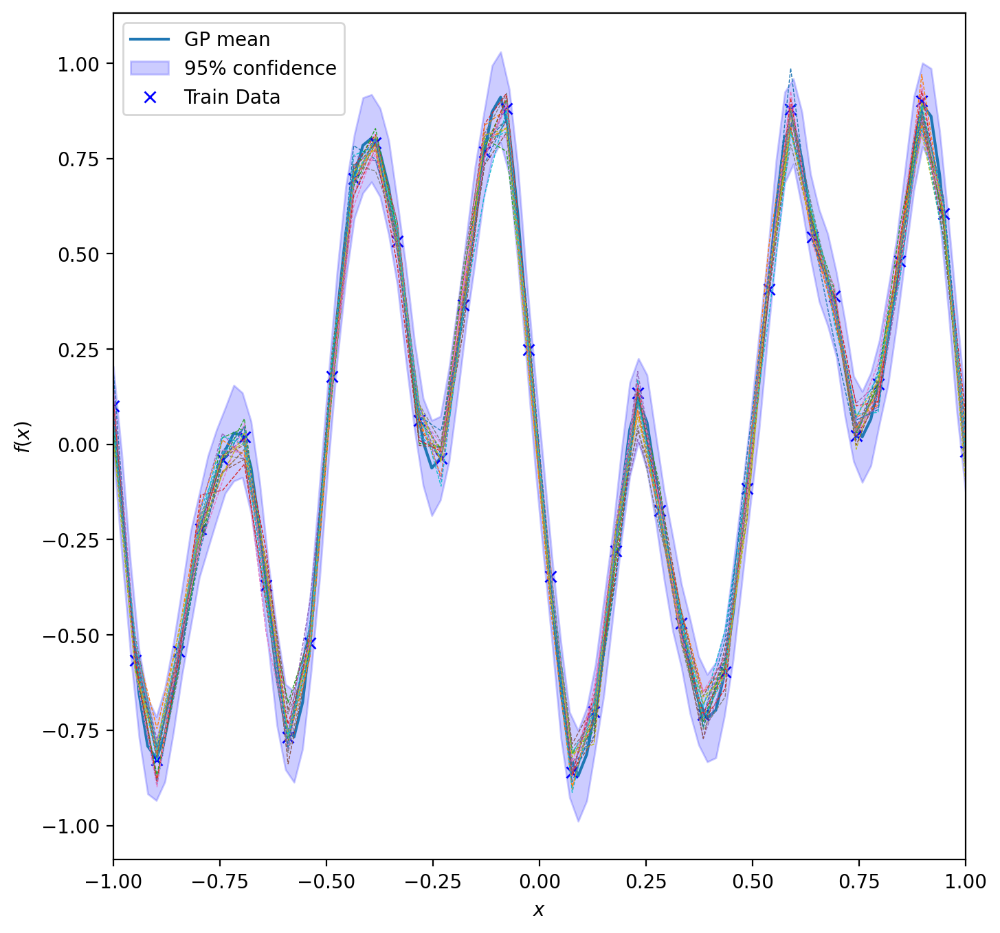

In [25]:
m.optimize_restarts(num_restarts = 10)
#fig = m.plot(plot_density=True)
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m, plot_density=True, ax=ax)
nsamples = 20
# Generate outputs of the model from the predictive distribution
posteriorYtest = m.posterior_samples_f(X, full_cov=True, size=nsamples)
ax.plot(X,posteriorYtest.reshape([-1,nsamples]),'--',lw=0.5,)
plt.show()

#### RationalQuadratic Kernel
The RationalQuadratic kernel can be viewed as a mixture (an infinite sum) of RBF kernels with different scale length parameters.  The kernel is given by:

$$
k\left(x_{i}, x_{j}\right)=\sigma^2 \left(1+\frac{d\left(x_{i}, x_{j}\right)^{2}}{2 \alpha l^{2}}\right)^{-\alpha}
$$
which as we have seen is parameterized by the lengthscale (`lengthscale`) $\ell^2$, the variance (`variance`)  $\sigma^2$ and a scale mixing parameter  (`power`) $\alpha$.

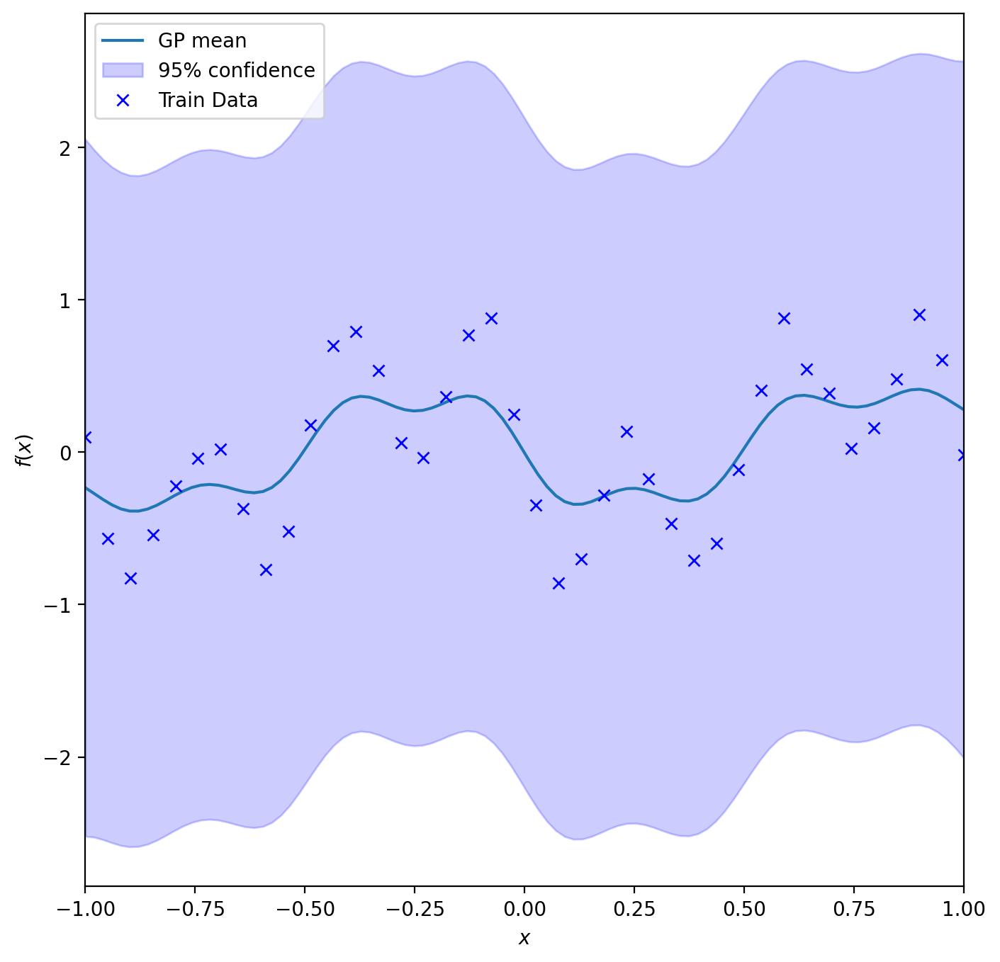

In [28]:
# power, como una combinación de varios gaussianos. It controls the mixture of
# RBF kernels with different lengthscales that make up the RationalQuadratic
# kernel.
# A higher value of $\alpha$$\alpha$ means that the kernel is a mixture of RBF kernels with a wider range of lengthscales

kernel = GPy.kern.RatQuad(input_dim=1, variance=1., lengthscale=0.1, power=0.5)
m = GPy.models.GPRegression(X,Y,kernel)
#fig = m.plot(plot_density=True)
plot_gp_model(m, plot_density=True)

Optimization restart 1/10, f = 0.21486299904133688
Optimization restart 2/10, f = 0.21486709346724453
Optimization restart 3/10, f = 0.21487010787709693
Optimization restart 4/10, f = 0.2148753647633157
Optimization restart 5/10, f = 0.2148652995006941
Optimization restart 6/10, f = 30.477131810707892
Optimization restart 7/10, f = 30.477131823386447
Optimization restart 8/10, f = 0.21486479727255414
Optimization restart 9/10, f = 0.2148701935891495
Optimization restart 10/10, f = 0.21486658270628922


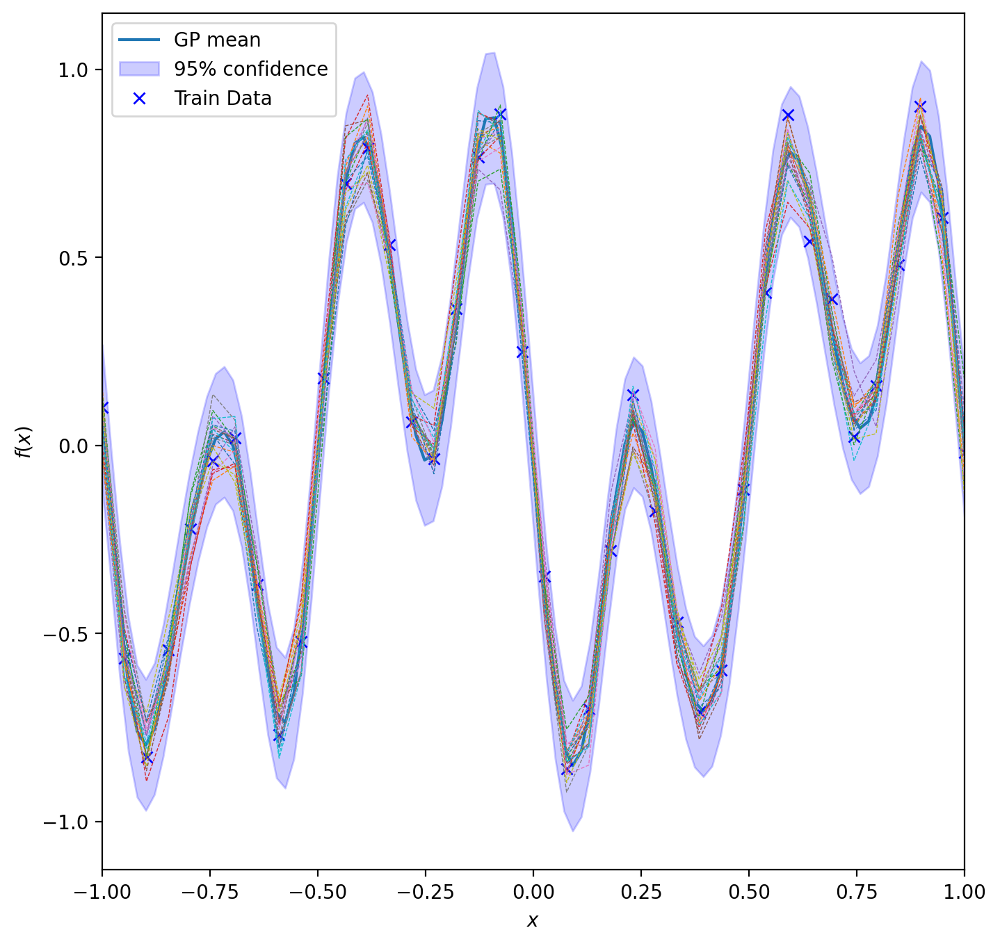

In [29]:
m.optimize_restarts(num_restarts = 10)
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m, plot_density=True, ax=ax)
nsamples = 20
# Generate outputs of the model from the predictive distribution
posteriorYtest = m.posterior_samples_f(X, full_cov=True, size=nsamples)
ax.plot(X,posteriorYtest.reshape([-1,nsamples]),'--',lw=0.5,)
plt.show()

#### Periodic Exponential Kernel
[The periodic exponential kernel](http://gpy.readthedocs.io/en/deploy/GPy.kern.src.html#module-GPy.kern.src.periodic) allows us to model periodic functions. Its expression is given by:
$$
k\left(x_{i}, x_{j}\right)=\sigma^2 \exp \left(-\frac{2 \sin ^{2}\left(\pi d\left(x_{i}, x_{j}\right) / p\right)}{l^{2}}\right)
$$

which as we can see includes a scale length parameter (`lengthscale`) $\ell^2$, the variance (`variance`) $\sigma^2$ and a periodicity parameter $p$ .

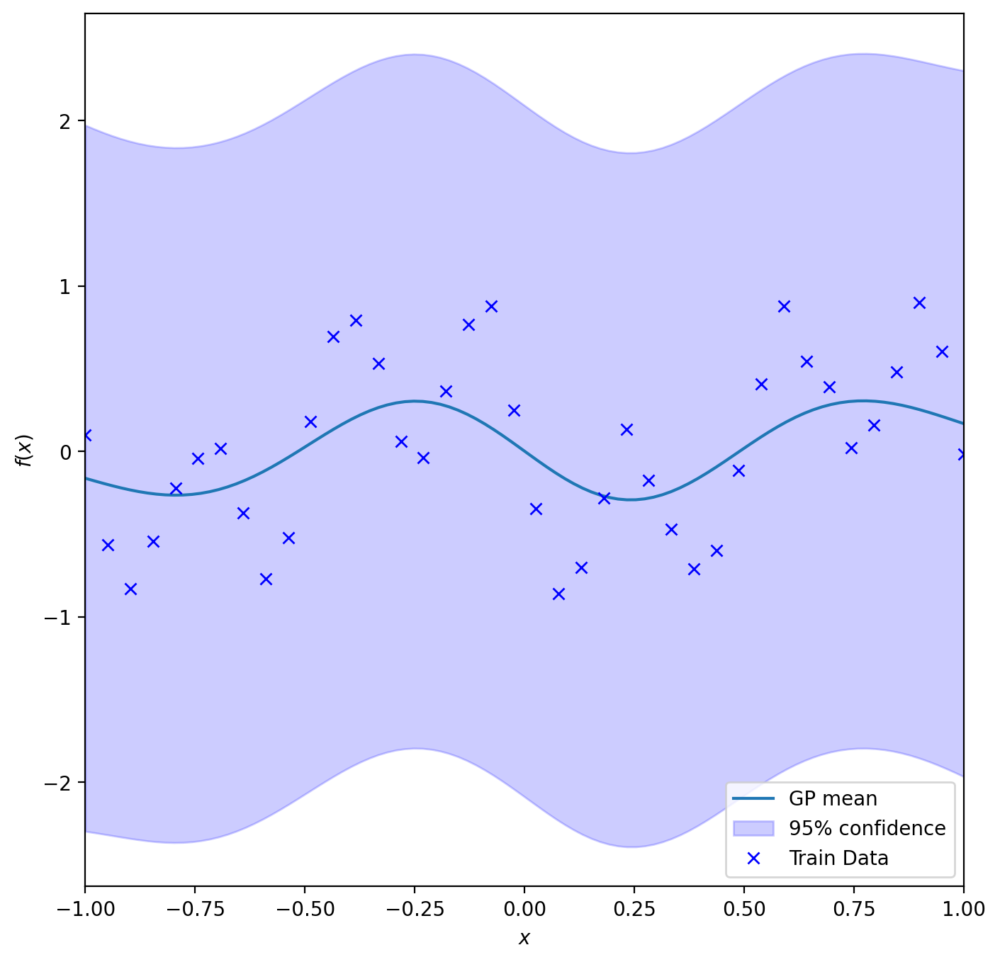

In [30]:
kernel = GPy.kern.PeriodicExponential(input_dim=1, variance=1., lengthscale=0.1, period=2*np.pi)
m = GPy.models.GPRegression(X,Y,kernel)
#fig = m.plot(plot_density=True)
plot_gp_model(m, plot_density=True)

Optimization restart 1/10, f = 25.818656443030417
Optimization restart 2/10, f = 30.477131870011355
Optimization restart 3/10, f = 8.363122757990013
Optimization restart 4/10, f = -8.99237691513931
Optimization restart 5/10, f = -8.992376667352488
Optimization restart 6/10, f = 26.98046849919514
Optimization restart 7/10, f = 30.477131869101107
Optimization restart 8/10, f = 26.980468311468698
Optimization restart 9/10, f = 30.477131821580784
Optimization restart 10/10, f = -8.992376892626545


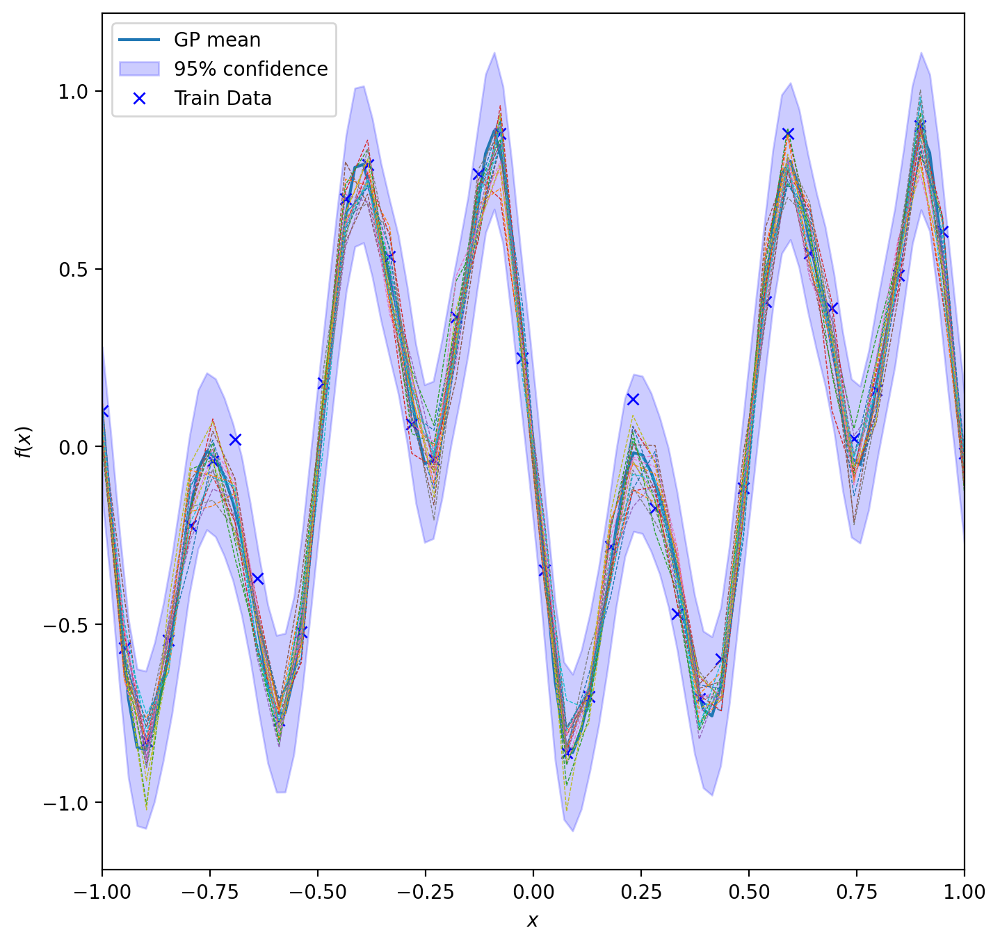

In [31]:
m.optimize_restarts(num_restarts = 10)
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m, plot_density=True, ax=ax)
nsamples = 20
# Generate outputs of the model from the predictive distribution
posteriorYtest = m.posterior_samples_f(X, full_cov=True, size=nsamples)
ax.plot(X,posteriorYtest.reshape([-1,nsamples]),'--',lw=0.5,)
plt.show()

### Advantages of the periodic exponential kernel

To analyze the advantages of this kernel in our problem, let's start by visualizing the model estimates with a Gaussian kernel that we have learned with our toy problem for values of $X\in[-5,5]$. Also the estimated mean.


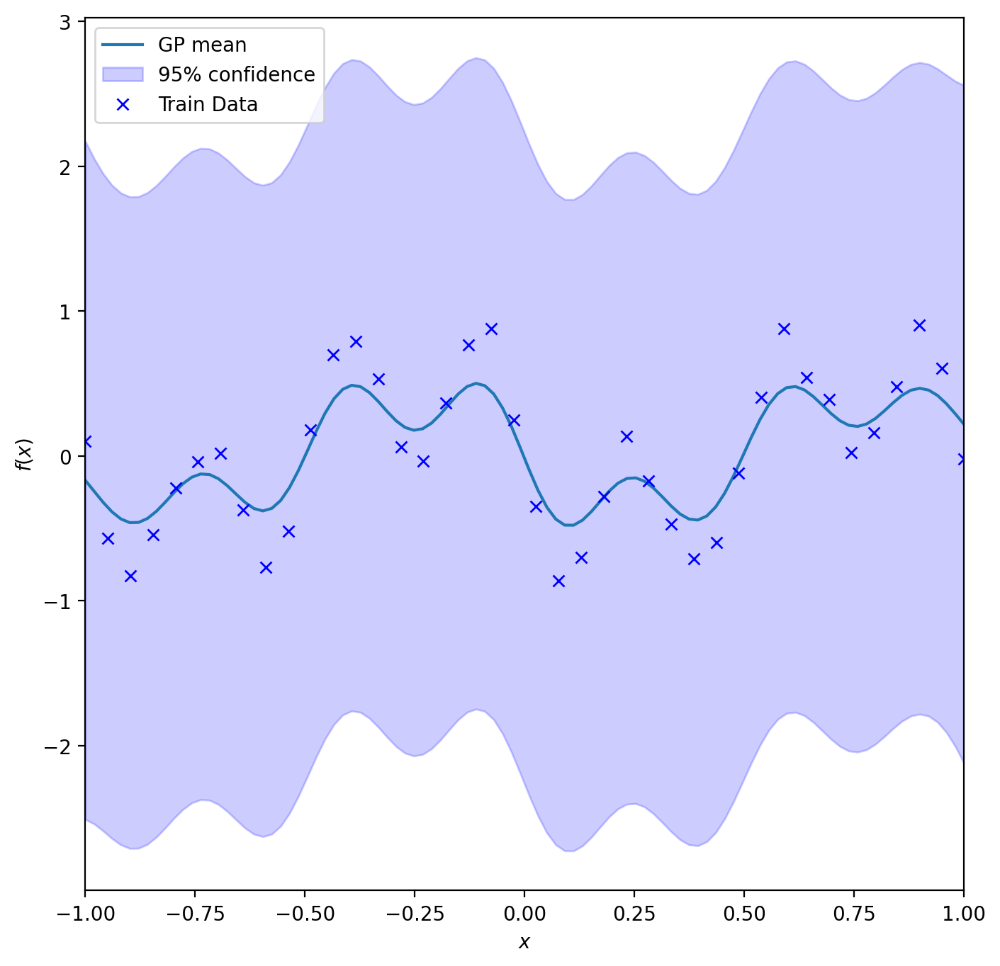

Optimization restart 1/10, f = 0.2148460469241762
Optimization restart 2/10, f = 26.345017398304805
Optimization restart 3/10, f = 26.34501739827792
Optimization restart 4/10, f = 7.939568561859808
Optimization restart 5/10, f = 26.345017398275868
Optimization restart 6/10, f = 30.477158718218355
Optimization restart 7/10, f = 30.477129870280756
Optimization restart 8/10, f = 30.477131889278915
Optimization restart 9/10, f = 26.345017398847613
Optimization restart 10/10, f = 26.34501739827626


In [32]:
kernel = GPy.kern.RBF(input_dim=1, variance=1., lengthscale=0.1)  # Try modify the lenghtscale
m = GPy.models.GPRegression(X,Y,kernel)
plot_gp_model(m, plot_density=True)
m.optimize_restarts(num_restarts = 10)

nsamples = 20
# Generate outputs of the model from the predictive distribution
posteriorYtest = m.posterior_samples_f(X_true, full_cov=True, size=nsamples)
# Compute the predictive mean
meanYtest,_ = m.predict(X_true,full_cov=True)


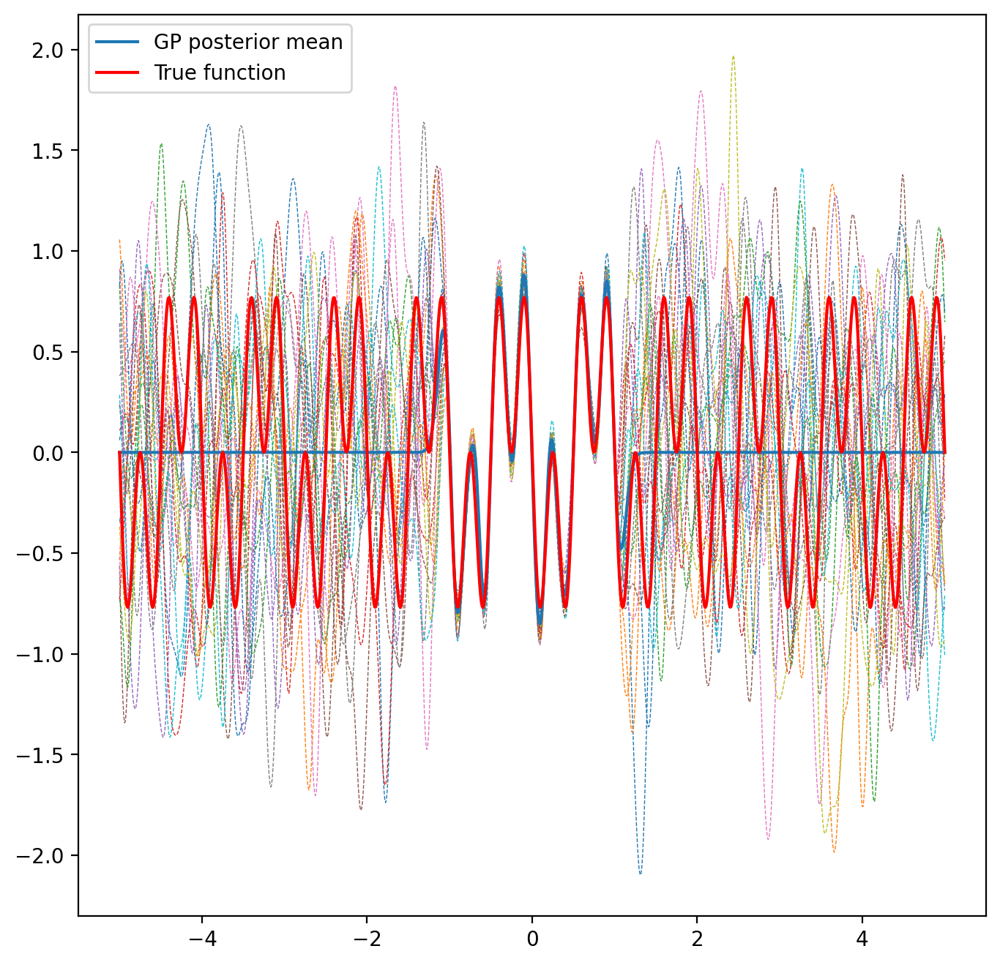

In [33]:
plt.figure()

plt.plot(X_true,posteriorYtest.reshape([-1,nsamples]),'--',lw=0.5,)
plt.plot(X_true,meanYtest,label='GP posterior mean')
plt.plot(X_true,Y_true,'r',label='True function')
plt.legend()

Obviously, since the GP has never seen data points outside the $[-1,1]$ range, its uncertainty outside this region grows very fast and its estimate is essentially a zero-mean output.

**What if we knew that the signal we are trying to fit is periodic?** If so, we could and should incorporate this information into the kernel itself! Let's use the periodic exponential kernel.


In [34]:
kernel2 = GPy.kern.PeriodicExponential(input_dim=1,variance=1.,lengthscale=1.) #The default initial value of period is 2*pi
m2 = GPy.models.GPRegression(X,Y,kernel2)
display(m2)

GP_regression.,value,constraints,priors
periodic_exponential.variance,1.0,+ve,
periodic_exponential.lengthscale,1.0,+ve,
periodic_exponential.period,6.283185307179586,+ve,
Gaussian_noise.variance,1.0,+ve,


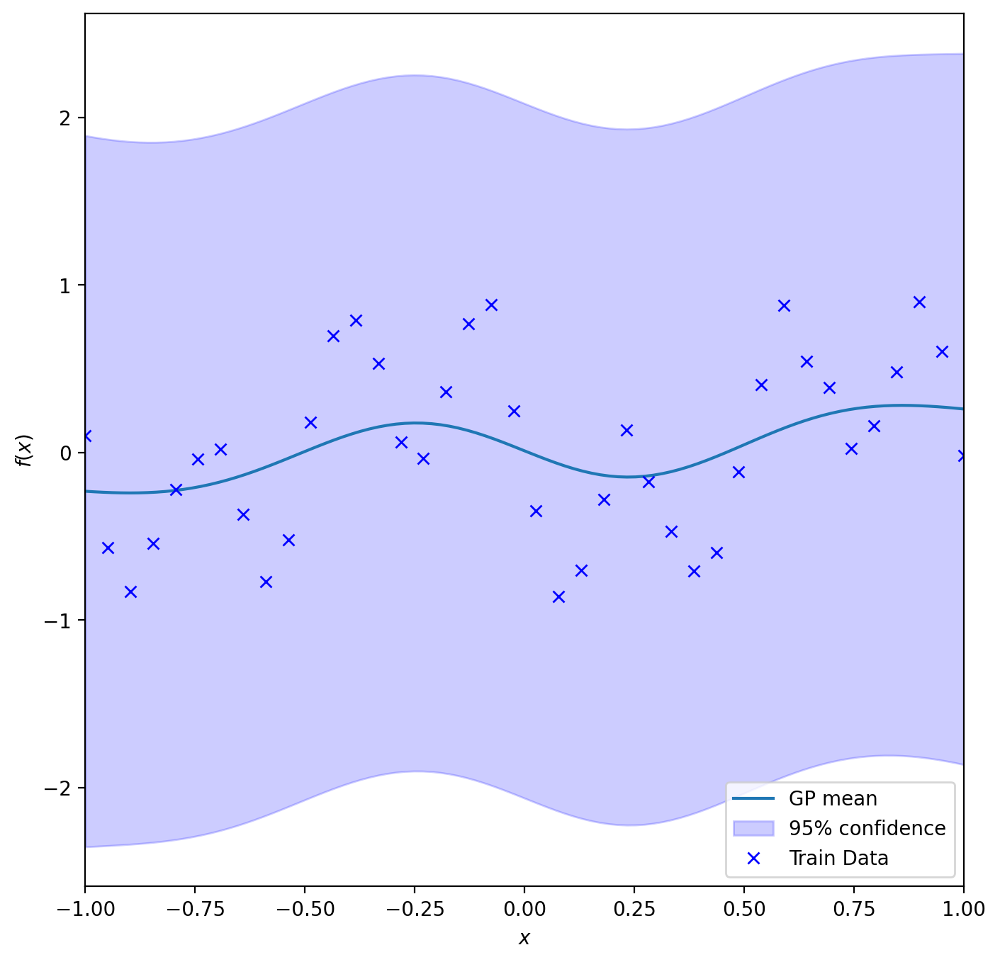

In [35]:
#fig = m2.plot(plot_density=True)
plot_gp_model(m2, plot_density=True)

Let's train the GP with the periodic kernel. **Remember that all our training points are still in the [-1,1]** region.


In [36]:
m2.optimize_restarts(num_restarts = 10)
display(m2) # Observe that the period is nicely found

Optimization restart 1/10, f = 25.81865644288063
Optimization restart 2/10, f = -6.888843888816915
Optimization restart 3/10, f = 8.36312275798602
Optimization restart 4/10, f = 14.77954743544516
Optimization restart 5/10, f = 19.493515305310815
Optimization restart 6/10, f = 26.980468311473555
Optimization restart 7/10, f = 26.980468312153093
Optimization restart 8/10, f = -8.99237690232135
Optimization restart 9/10, f = 8.363122757985746
Optimization restart 10/10, f = 19.49351530162958


GP_regression.,value,constraints,priors
periodic_exponential.variance,112.15009315284776,+ve,
periodic_exponential.lengthscale,5.671441786564439,+ve,
periodic_exponential.period,0.9943408698482723,+ve,
Gaussian_noise.variance,0.008332875902830772,+ve,


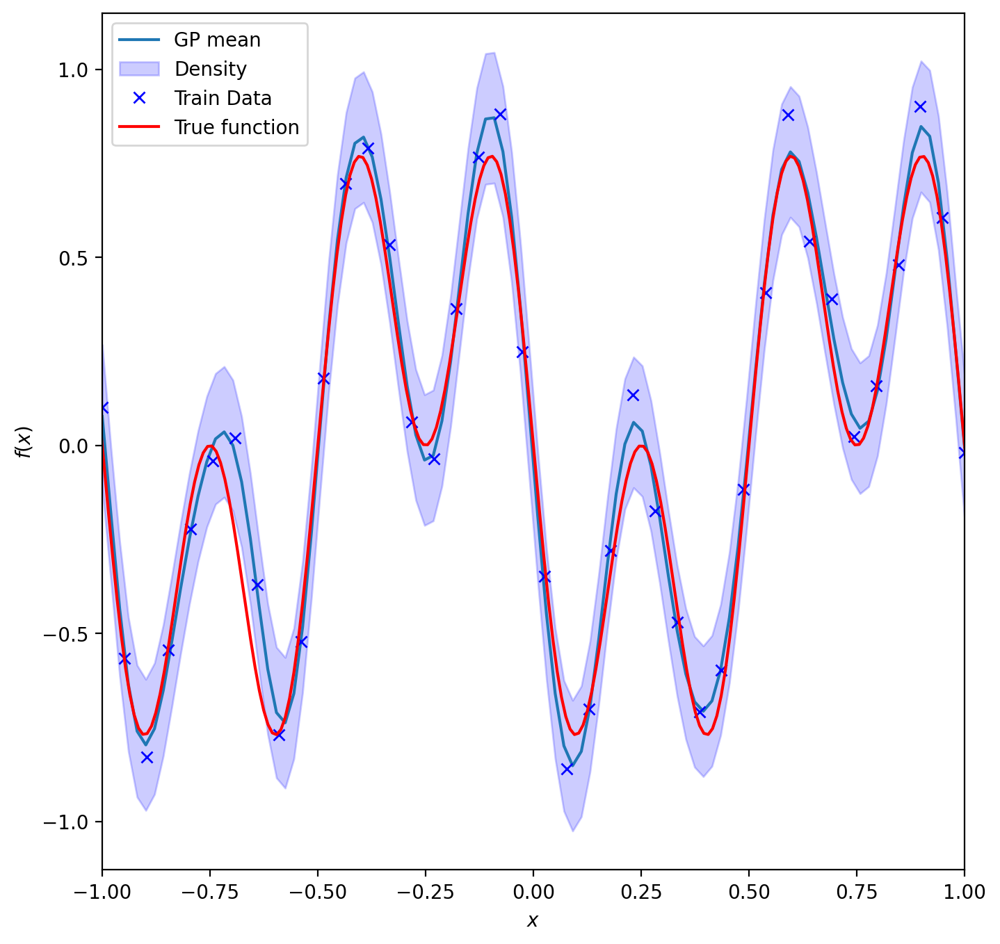

In [37]:
#fig = m2.plot(plot_density=True)
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m, plot_density=True, ax=ax)

ax.plot(X_true,Y_true,'r')
plt.xlim([-1,1])
plt.legend(['GP mean','Density','Train Data','True function'])

If we now represent series generated by the GP predictive distribution, we immediately realize that, by exploiting the periodicity of the unobserved signal, it is able to generalize to regions where it never saw any training points.


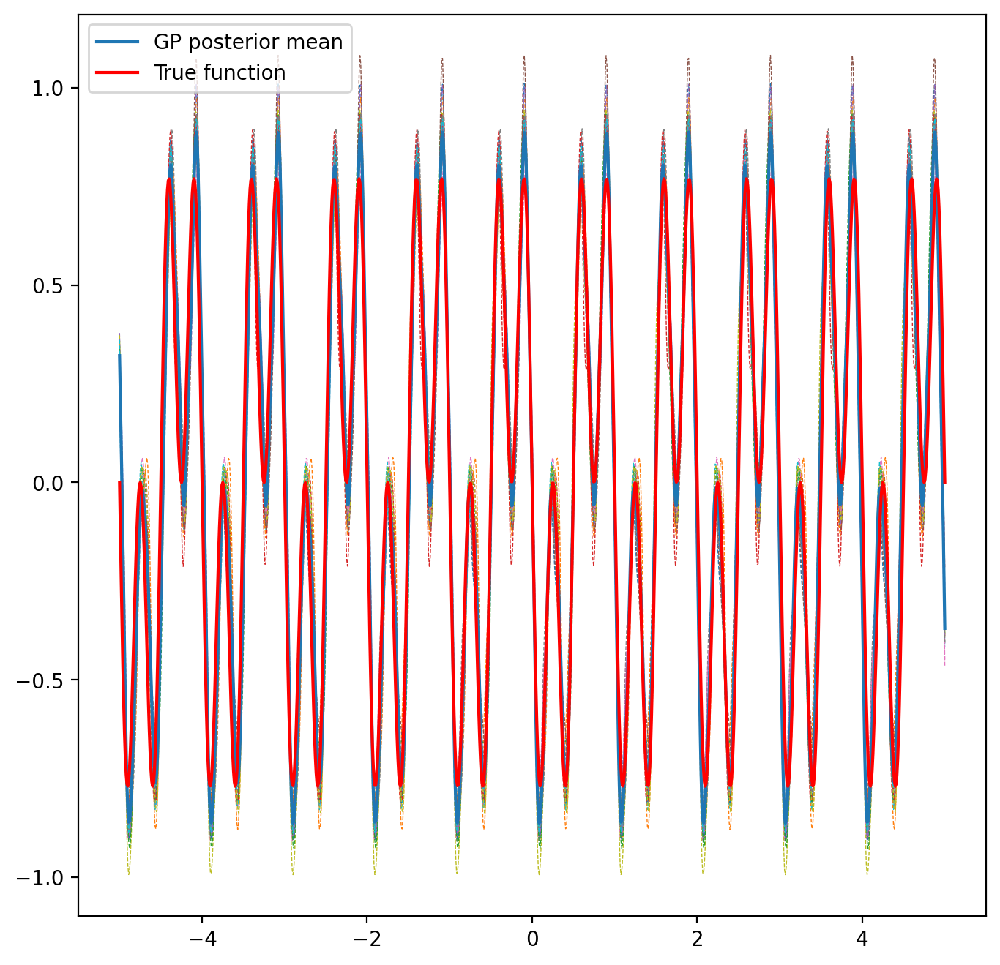

In [38]:
posteriorYtest2 = m2.posterior_samples_f(X_true, full_cov=True, size=nsamples)
meanYtest2,_ = m2.predict(X_true,full_cov=True)

plt.figure()

plt.plot(X_true,posteriorYtest2.reshape([-1,nsamples]),'--',lw=0.5,)
plt.plot(X_true,meanYtest2,label='GP posterior mean')
plt.plot(X_true,Y_true,'r',label='True function')
plt.legend()

## 2.3 Operations to combine kernels

In GPy, kernel objects can be combined (added or multiplied) with each other to create a multitude of kernel objects. The parameters and their gradients are handled automatically, and thus appear in the combined objects. This simplifies our life because when the combined kernels are used within GP objects, all the necessary gradients are automatically calculated using the chain rule.

Generating these combined kernels is very simple, here are some examples:

  mul.               |  value  |  constraints  |  priors
  rbf.variance       |    1.0  |      +ve      |        
  rbf.lengthscale    |    2.0  |      +ve      |        
  Mat32.variance     |    0.5  |      +ve      |        
  Mat32.lengthscale  |    0.2  |      +ve      |        
  sum.               |  value  |  constraints  |  priors
  rbf.variance       |    1.0  |      +ve      |        
  rbf.lengthscale    |    2.0  |      +ve      |        
  Mat32.variance     |    0.5  |      +ve      |        
  Mat32.lengthscale  |    0.2  |      +ve      |        


{'covariance': [[<matplotlib.lines.Line2D at 0x780d279a78c0>]]}

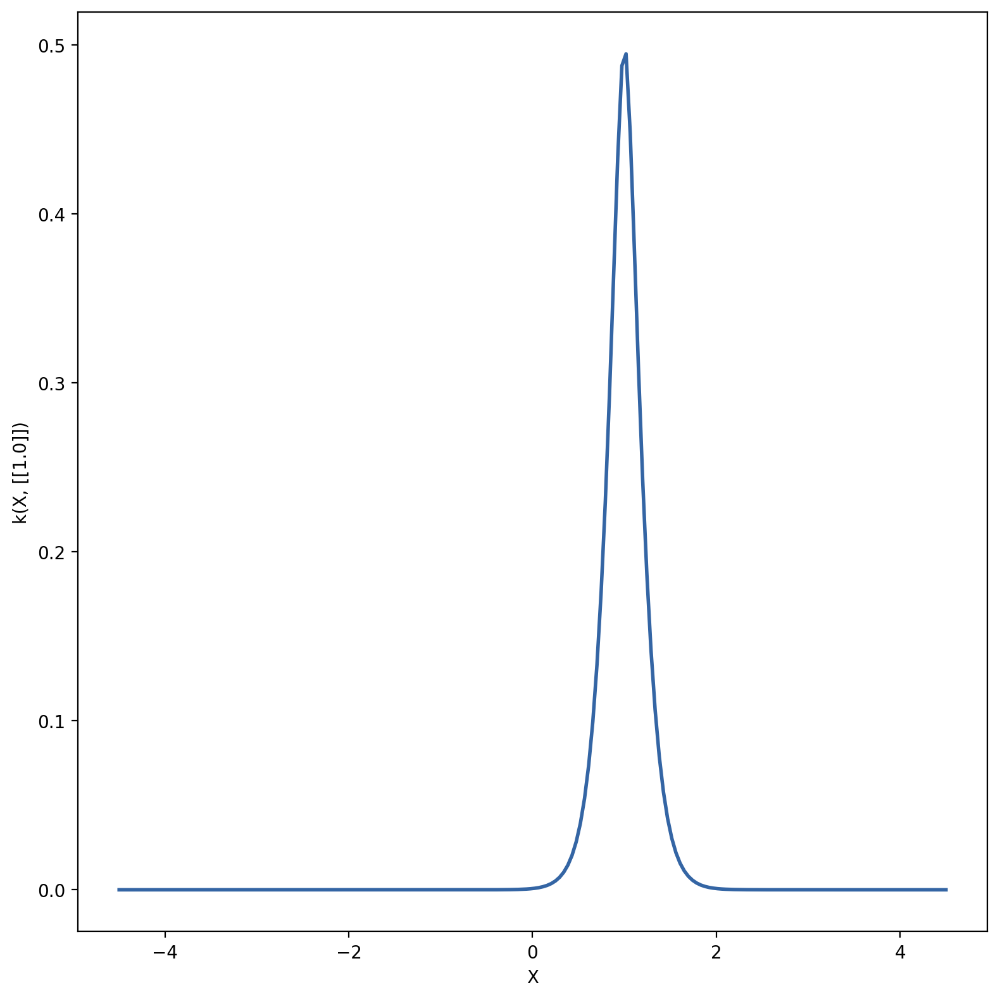

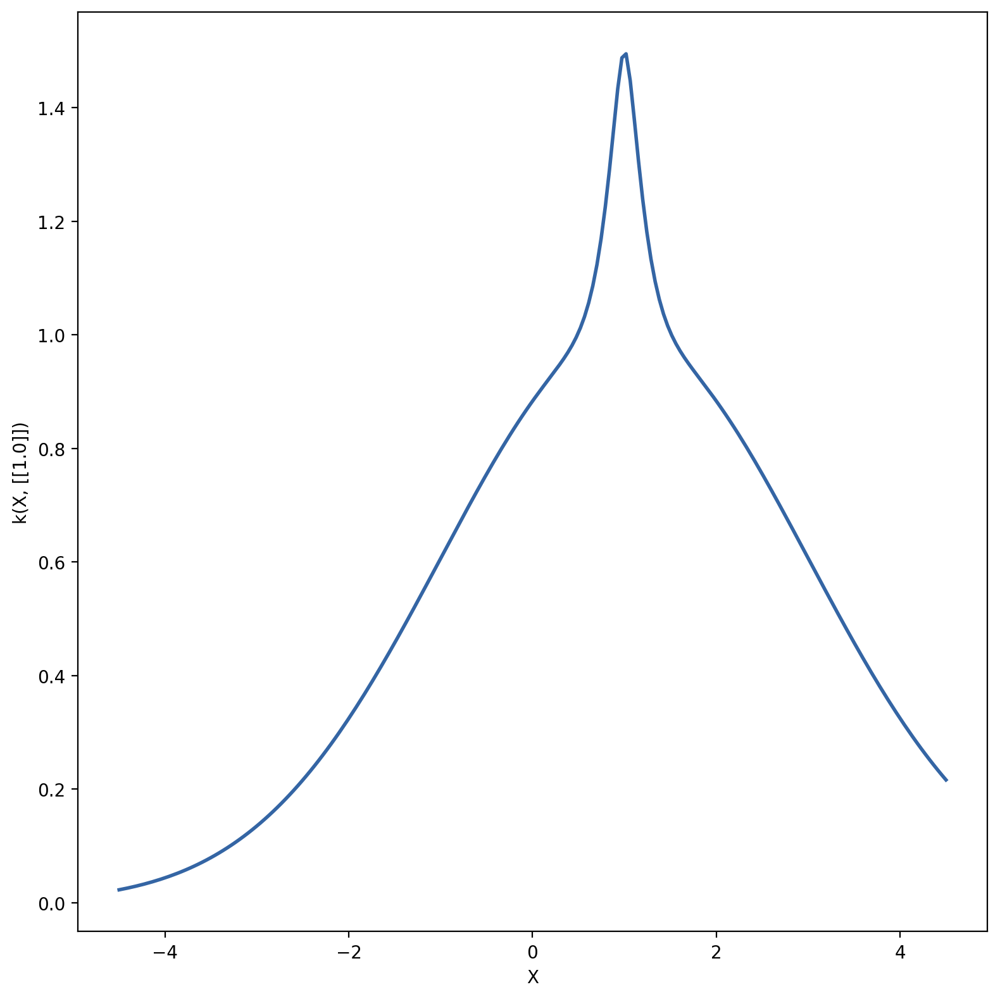

In [39]:
# Product of kernels
k1 = GPy.kern.RBF(1,1.,2.)
k2 = GPy.kern.Matern32(1, 0.5, 0.2)
k_prod = k1 *k2
print(k_prod)
k_prod.plot()



# Sum of kernels
k1 = GPy.kern.RBF(1,1.,2.)
k2 = GPy.kern.Matern32(1, 0.5, 0.2)
k_add = k1 + k2
print(k_add)
k_add.plot()

### Prediction of atmospheric carbon dioxide from Mauna Loa

This example is based on one of the examples included in Chapter 5 of the book [*Gaussian Processes for Machine Learning*](http://www.gaussianprocess.org/gpml/chapters/RW.pdf).

Specifically, we will use a modeling problem based on the estimation of atmospheric CO2 concentration from samples collected at the Mauna Loa Observatory in Hawaii between 1958 and 1997. With this problem we will illustrate the potential of combining multiple kernels and how marginal likelihood can be used to fit multiple hyperparameters jointly.

To solve the problem, we are going to use a kernel composed of several terms that are responsible for explaining different properties of the signal:

* An RBF kernel that allows us to explain a long-term smooth upward trend. The RBF kernel with a large scale length forces this component to be smooth; the trend is not forced to be upward, leaving this choice to the GP. The specific scale length and amplitude are free hyperparameters.

* A seasonal component, which must be explained by the periodic kernel with a fixed periodicity of 1 year (it is the only parameter we pre-set). The length scale of this periodic component, which controls its smoothness, we leave as a free parameter. To allow periodicity decay we will multiply this component by an RBF kernel where its length scale will control the decay time and will be another free parameter.

* Smaller and medium term irregularities are explained by a RationalQuadratic kernel, whose length scale and power parameter, which determines the diffusivity of the length scales, will also be learned by the model. These irregularities can be better accounted for with a RationalQuadratic kernel than with an RBF one, because the former can accommodate several length scales.

* A "noise" term, consisting of a contribution from the RBF kernel, which will account for correlated noise components (e.g. by local weather phenomena), and a white noise kernel (`WhiteKernel`). The relative amplitudes and the length scale of the RBF will be other free parameters.

In [40]:
from sklearn.datasets import fetch_openml

def load_mauna_loa_atmospheric_co2():
    ml_data = fetch_openml(data_id=41187, as_frame=False)
    months = []
    ppmv_sums = []
    counts = []

    y = ml_data.data[:, 0]
    m = ml_data.data[:, 1]
    month_float = y + (m - 1) / 12
    ppmvs = ml_data.target

    for month, ppmv in zip(month_float, ppmvs):
        if not months or month != months[-1]:
            months.append(month)
            ppmv_sums.append(ppmv)
            counts.append(1)
        else:
            # aggregate monthly sum to produce average
            ppmv_sums[-1] += ppmv
            counts[-1] += 1

    months = np.asarray(months).reshape(-1, 1)
    avg_ppmvs = np.asarray(ppmv_sums) / counts
    return months, avg_ppmvs.reshape([avg_ppmvs.shape[0],-1])


X, y = load_mauna_loa_atmospheric_co2()


GP_regression.,value,constraints,priors
sum.rbf.variance,4356.0,+ve,
sum.rbf.lengthscale,67.0,+ve,
sum.mul.rbf.variance,5.76,+ve,
sum.mul.rbf.lengthscale,90.0,+ve,
sum.mul.periodic_exponential.variance,1.0,+ve,
sum.mul.periodic_exponential.lengthscale,1.3,+ve,
sum.mul.periodic_exponential.period,1.0,+ve,
sum.RatQuad.variance,0.43560000000000004,+ve,
sum.RatQuad.lengthscale,1.2,+ve,
sum.RatQuad.power,0.78,+ve,


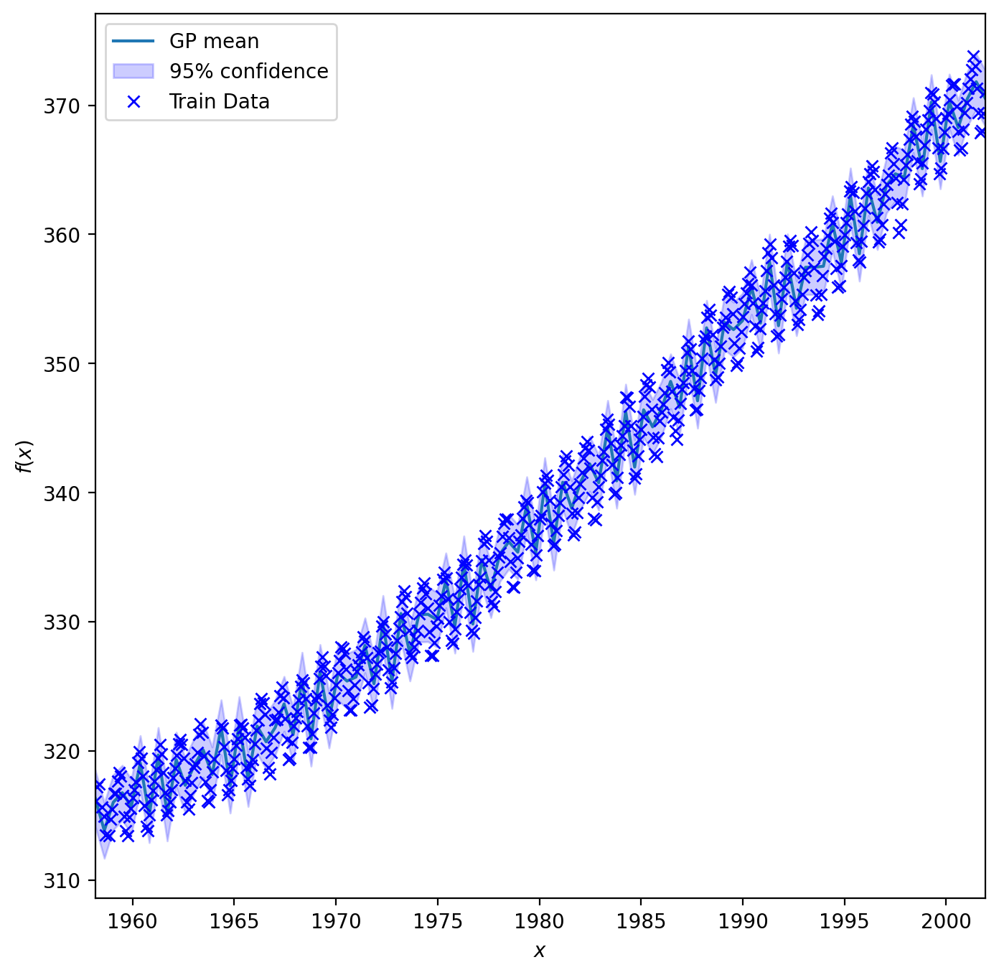

In [41]:
# Kernel with optimum parameters given in GPML book
k1 = GPy.kern.RBF(input_dim=1, variance=66.0**2, lengthscale=67.0)  #long term smooth rising trend
k2 = GPy.kern.RBF(input_dim=1, variance=2.4**2 , lengthscale=90.0) \
    * GPy.kern.PeriodicExponential(input_dim=1, variance=1., lengthscale=1.3, period=1.) # seasonal component
k3 =GPy.kern.RatQuad(input_dim=1, variance=0.66**2, lengthscale=1.2, power=0.78) # medium term irregularity
k4 = GPy.kern.RBF(input_dim=1, variance=0.18**2 , lengthscale=0.134)  \
    + GPy.kern.White(input_dim=1, variance=0.19**2)  # noise terms
kernel_gpml = k1 + k2 + k3 + k4

m_atmosferic = GPy.models.GPRegression(X,y,kernel_gpml)
display(m_atmosferic)

#fig = m_atmosferic.plot(plot_density=True)
plot_gp_model(m_atmosferic, plot_density=True)



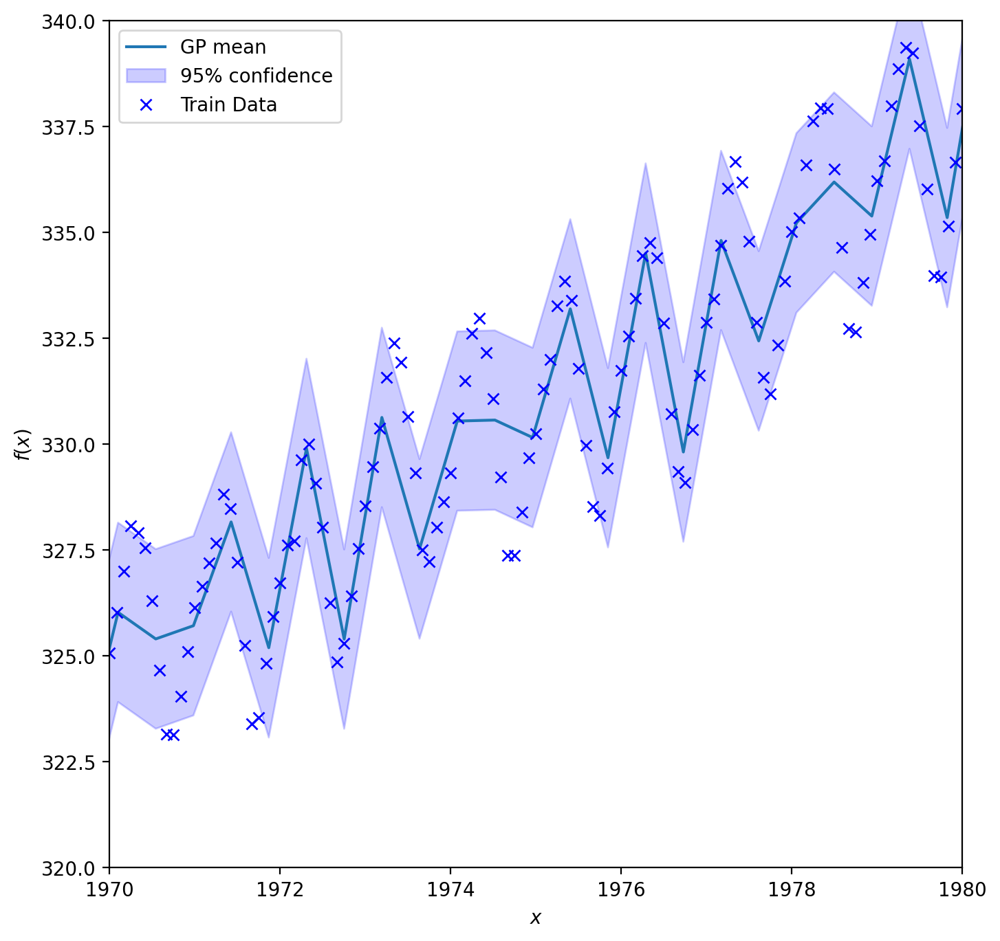

In [42]:
# Zoom over the last figure
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m_atmosferic, plot_density=True, ax=ax)

plt.xlim(1970,1980)
plt.ylim(320,340)
plt.show()

In [43]:
m_atmosferic.kern.mul.periodic_exponential.period

GP_regression.sum.mul.periodic_exponential.period:
Param([1.])

Optimization restart 1/10, f = 178.73803643319218
Optimization restart 2/10, f = 276.98076865248083
Optimization restart 3/10, f = 275.7776306719977
Optimization restart 4/10, f = 161.38003549942835
Optimization restart 5/10, f = 502.724385517574
Optimization restart 6/10, f = 650.1304177754114
Optimization restart 7/10, f = 288.29730988651374
Optimization restart 8/10, f = 368.4729528657341
Optimization restart 9/10, f = 518.1391847569073
Optimization restart 10/10, f = 644.0062616364885


GP_regression.,value,constraints,priors
sum.rbf.variance,0.22487892827924208,+ve,
sum.rbf.lengthscale,0.6265454851004606,+ve,
sum.mul.rbf.variance,389.90278751245773,+ve,
sum.mul.rbf.lengthscale,82.16558226807193,+ve,
sum.mul.periodic_exponential.variance,278.9249195953075,+ve,
sum.mul.periodic_exponential.lengthscale,1390.8603516549708,+ve,
sum.mul.periodic_exponential.period,1.0,+ve fixed,
sum.RatQuad.variance,48160.23053584914,+ve,
sum.RatQuad.lengthscale,265.7275497233078,+ve,
sum.RatQuad.power,2.718482617322995e-130,+ve,


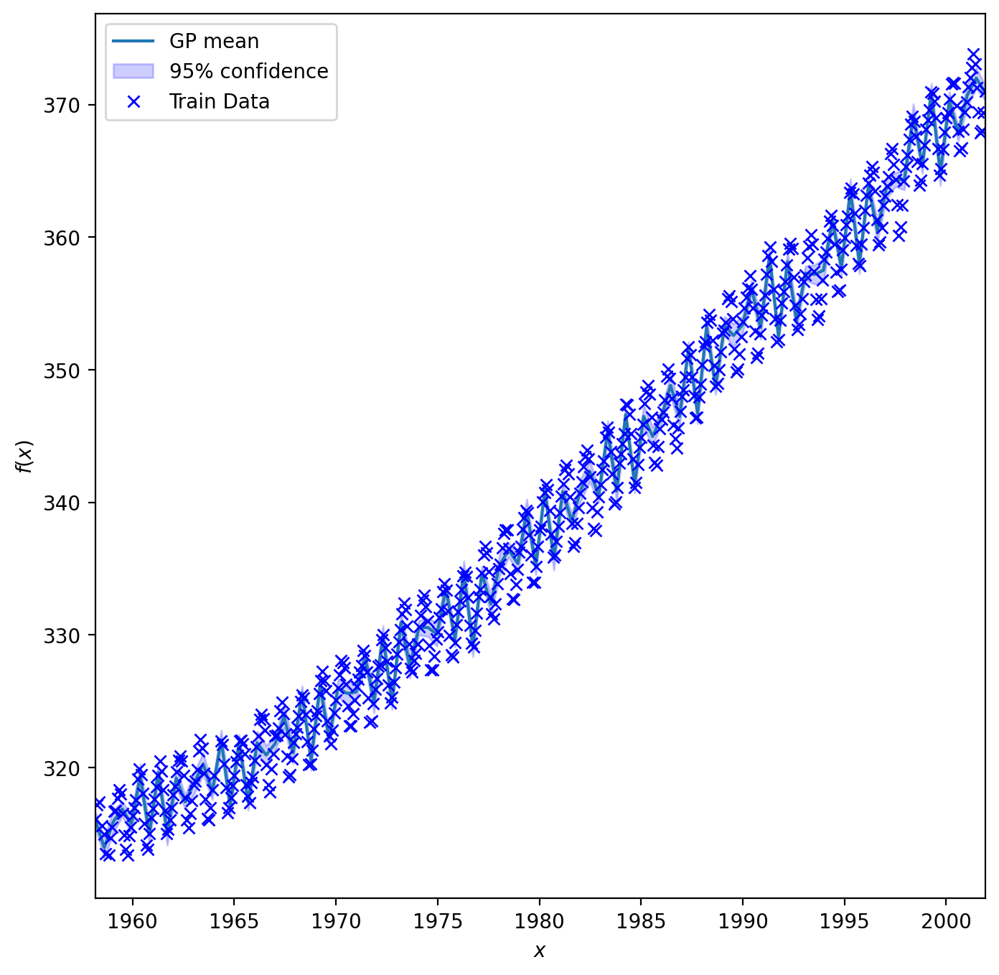

In [44]:
# Kernel with default parameters to be learnt
k1 = GPy.kern.RBF(input_dim=1)  #long term smooth rising trend
k2 = GPy.kern.RBF(input_dim=1) \
    * GPy.kern.PeriodicExponential(input_dim=1,  period=1.) # seasonal component
                                                            # Period is difficult
                                                            # to optimize so its
                                                            # better to define it
                                                            # on the beggining
k3 =GPy.kern.RatQuad(input_dim=1) # medium term irregularity
k4 = GPy.kern.RBF(input_dim=1)  \
    + GPy.kern.White(input_dim=1)  # noise terms
kernel_gpml = k1 + k2 + k3 + k4

m_atmosferic = GPy.models.GPRegression(X,y,kernel_gpml)
m_atmosferic.kern.mul.periodic_exponential.period.fix()
m_atmosferic.optimize_restarts(num_restarts = 10)

display(m_atmosferic)

plot_gp_model(m_atmosferic, plot_density=True)

As we can see, with a good kernel definition, the GP is able to capture all the trends of the signal and, moreover, by maximizing the likelihood we are able to learn all the parameters involved.

Esto es una ventaja frente a otros metodos que involucren kernels como svm, ya que ajustan más parámetros haciendo kernels conjuntos.

## 2.4 Operating on different domains

When multiplying and adding kernels, there are two general possibilities, one can assume that the kernels to be added/multiplied are defined over the same space or over different spaces:
* one kernel over  $\Re \times \Re$: $k(x,x′)=k_1(x,x′)×k_2(x,x′)$.
* another kernel over $\Re_2 \times \Re_2$: $k(y,y′)=k_1(y,y′)×k_2(y,y′)$.

To keep things as general as possible, in GPy kernels are assigned an  parameter `active_dims` that tells the kernel which dimensions to work on. To create a kernel that is a product of kernels in different spaces, we can do the following:

{'covariance': [<matplotlib.contour.QuadContourSet at 0x780d19a72de0>]}

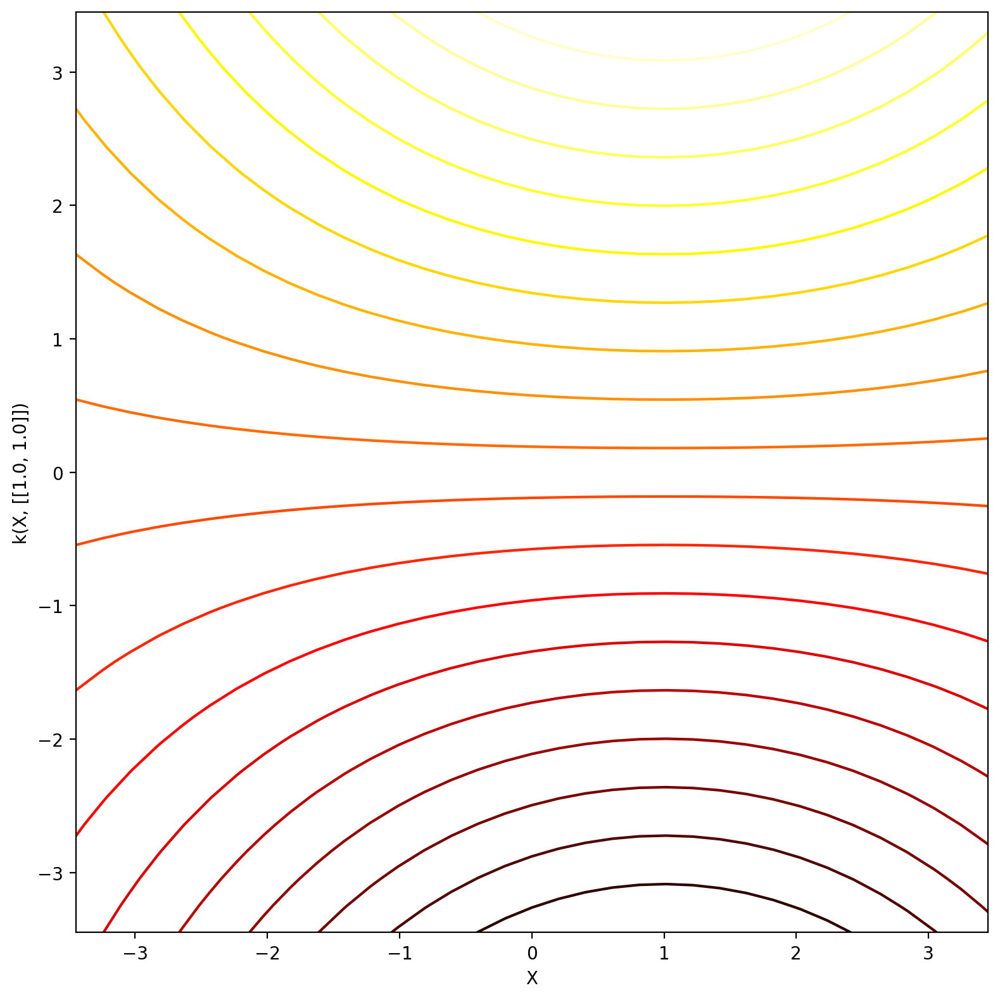

In [45]:
k1 = GPy.kern.Linear(input_dim=1, active_dims=[0]) # works on the first column of X, index=0
k2 = GPy.kern.RBF(input_dim=1, lengthscale=3, active_dims=[1]) # works on the second column of X, index=1
k = k1 * k2

k.plot(x=np.ones((1,2)))  # Representamos el kernel del grid de puntos con el punto [1,1]

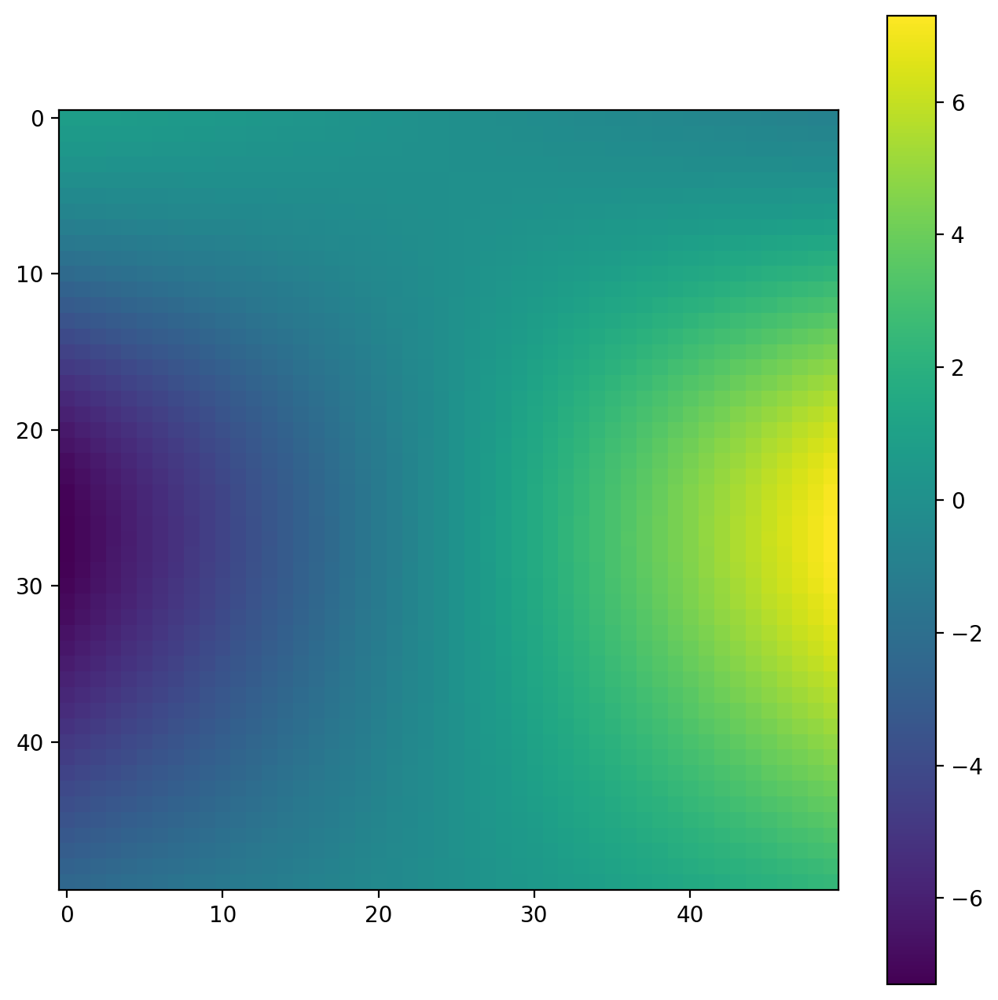

In [46]:
def plot_sample(k):
    x_axis = np.linspace(-5, 5, 50)
    y_axis = np.linspace(-5, 5, 50)
    xx, yy = np.meshgrid(x_axis, y_axis)

    X = np.vstack((xx.flatten(), yy.flatten())).T
    K = k.K(X)
    s = np.random.multivariate_normal(np.zeros(X.shape[0]), K)
    plt.imshow(s.reshape(*xx.shape), interpolation='nearest')

    my_ticks = np.linspace(0,len(x_axis),10)
    plt.xticks()
    plt.yticks()
    plt.colorbar()
plot_sample(k)

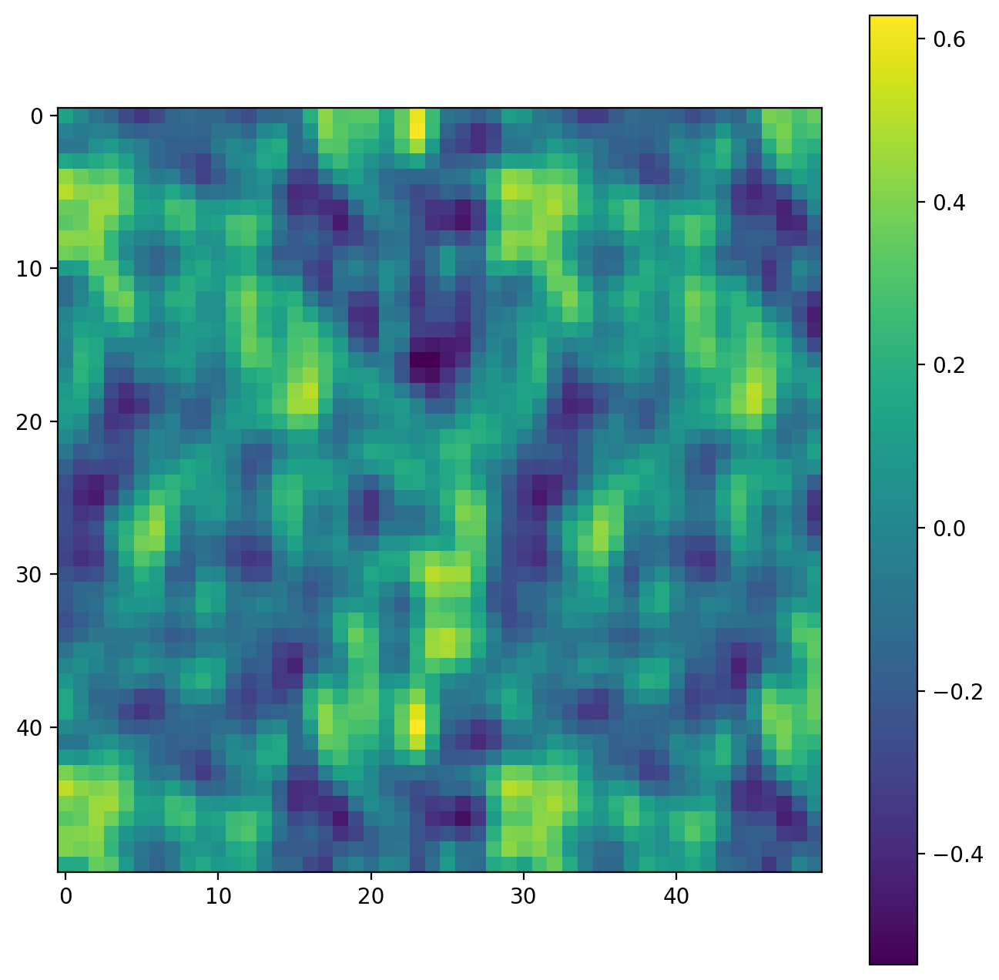

In [47]:
k1 = GPy.kern.PeriodicExponential(input_dim=1, active_dims=[0], period=6, lower=-10, upper=10) + GPy.kern.Bias(1, variance=0, active_dims=[0])
k2 = GPy.kern.PeriodicExponential(input_dim=1, active_dims=[1], period=8, lower=-10, upper=10) + GPy.kern.Bias(1, variance=0, active_dims=[0])

k = k1 * k2
plot_sample(k)

## 3. Automatic Relevance Determination

The GPy library and its kernel module allow to include a specific coefficient on each feature or input variable to automatically learn the importance of each feature. This is known as **Automatic Relevance Determination (ARD)**. For example, the RBF-ARD kernel is defined as.


\begin{align}
k(\mathbf{x},\mathbf{x}^*) = \sigma^2 \exp \left(- \sum_{d=1}^{D} \frac{(x_d-x_d^*)^2}{2\ell_d^2}\right)
\end{align}

where there is now a specific scale length $\ell_d$ for each input dimension, allowing interpretation of how relevant each variable is.

los pesos de cada input dimension tiene una $l_d$ en particular, lo que determina la importancia de esta dimensión.


### Example 1: Regression with ARD

Let's generate another database, this time with two-dimensional entries.


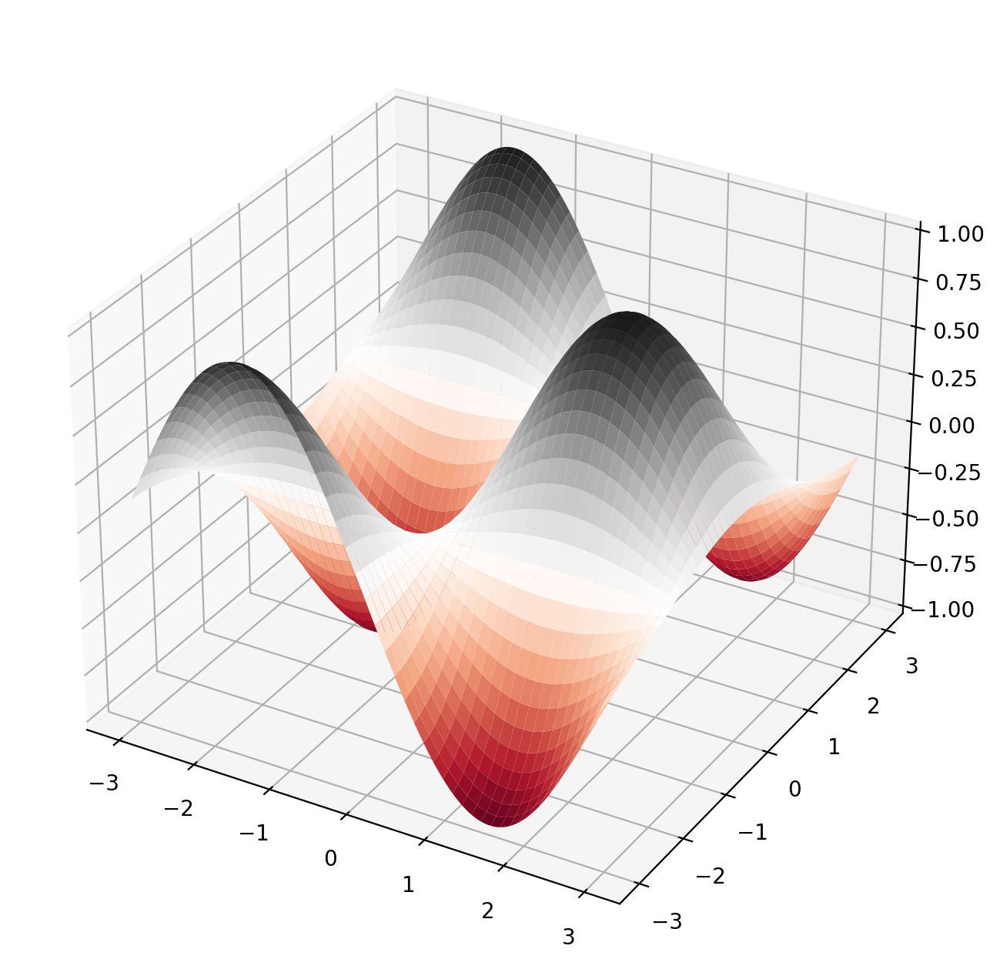

In [ ]:
# True surface
intervals = 200
a = np.linspace(-3, 3, intervals)
b = np.linspace(-3, 3, intervals)

C,D = np.meshgrid(a,b)

cyd = np.vstack([C.ravel(), D.ravel()]).T

Z = np.sin(cyd[:,0])* np.cos(cyd[:,1])

Z = Z.reshape([intervals,intervals])

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(C, D, Z, cmap='RdGy')



We generate observations

In [48]:
# sample noisy training points
npoints = 50
X = np.random.uniform(-3.,3.,(npoints,2))
Y = np.sin(X[:,0]) * np.cos(X[:,1])+np.random.randn(npoints,)*np.sqrt(0.01)

We train our GP

{'dataplot': [<matplotlib.collections.PathCollection at 0x780d198ebec0>],
 'gpmean': [<matplotlib.contour.QuadContourSet at 0x780d19a80860>]}

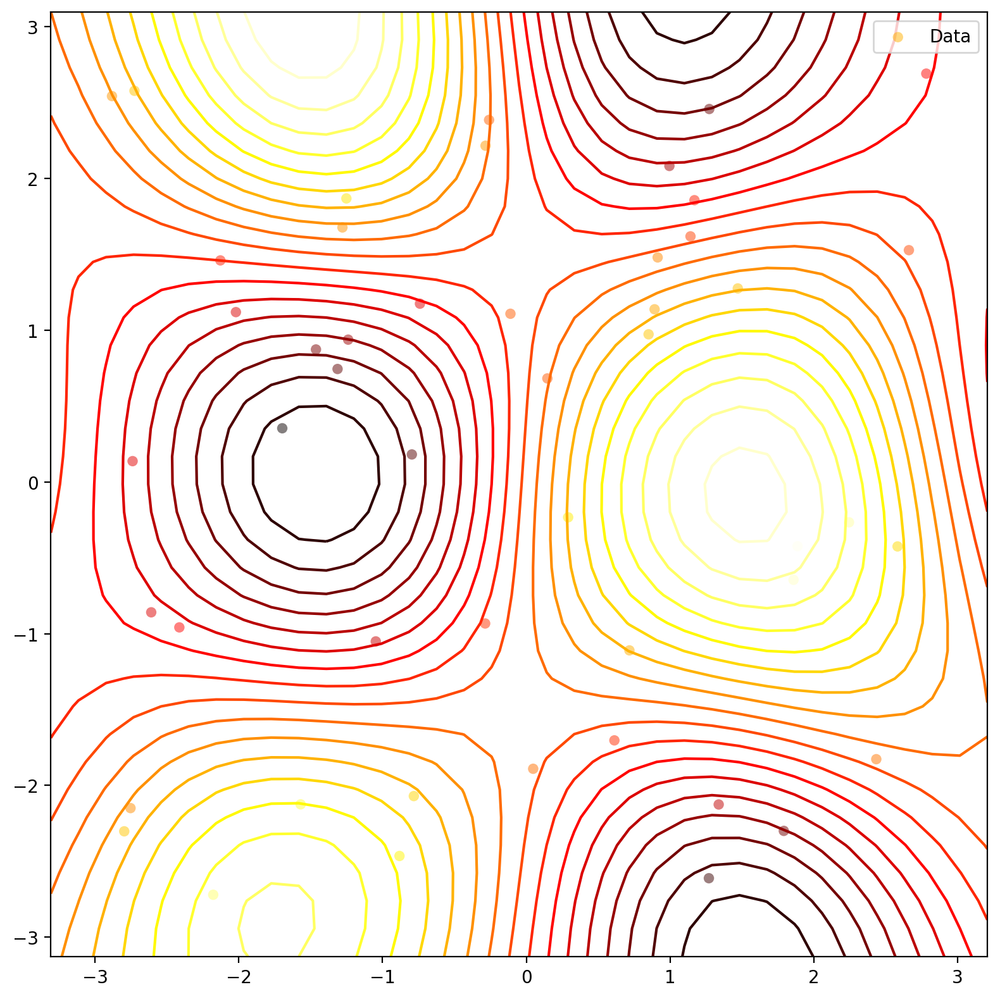

In [49]:
# define kernel: when we use ARD we combine the kernel with a white noise kernel
# to avoid problems in case al ARD terms cancel all features
ker3 = GPy.kern.RBF(2,ARD=True) + GPy.kern.White(2)

# create simple GP model
m3 = GPy.models.GPRegression(X,Y.reshape([-1,1]),ker3)

# optimize and plot
m3.optimize(messages=True,max_f_eval = 1000)
m3.plot()




Note that we have used an RBF kernel with **Automatic Relevance Determination** plus a white noise kernel. Let's get a list of all the kernel hyperparameters and their values.


In [50]:
print(ker3.parameter_names())

print(ker3.rbf.variance.values)

print(ker3.rbf.lengthscale.values)

print(ker3.white.variance.values)

['rbf.variance', 'rbf.lengthscale', 'white.variance']
[0.42153607]
[1.26392783 1.49701851]
[0.00325307]


As we see in `rbf.lengthscale` we have two values, one associated to each input variable. In this example, both dimensions have the same weight in the GP kernel. Let's create another example where this does not happen.

### Example 2: Regression with ARD

We repeat the previous example, but notice that now the points $Y$ are not really correlated through $X[:,1]$. This should be captured by the ARD parameter in the GP kernel!

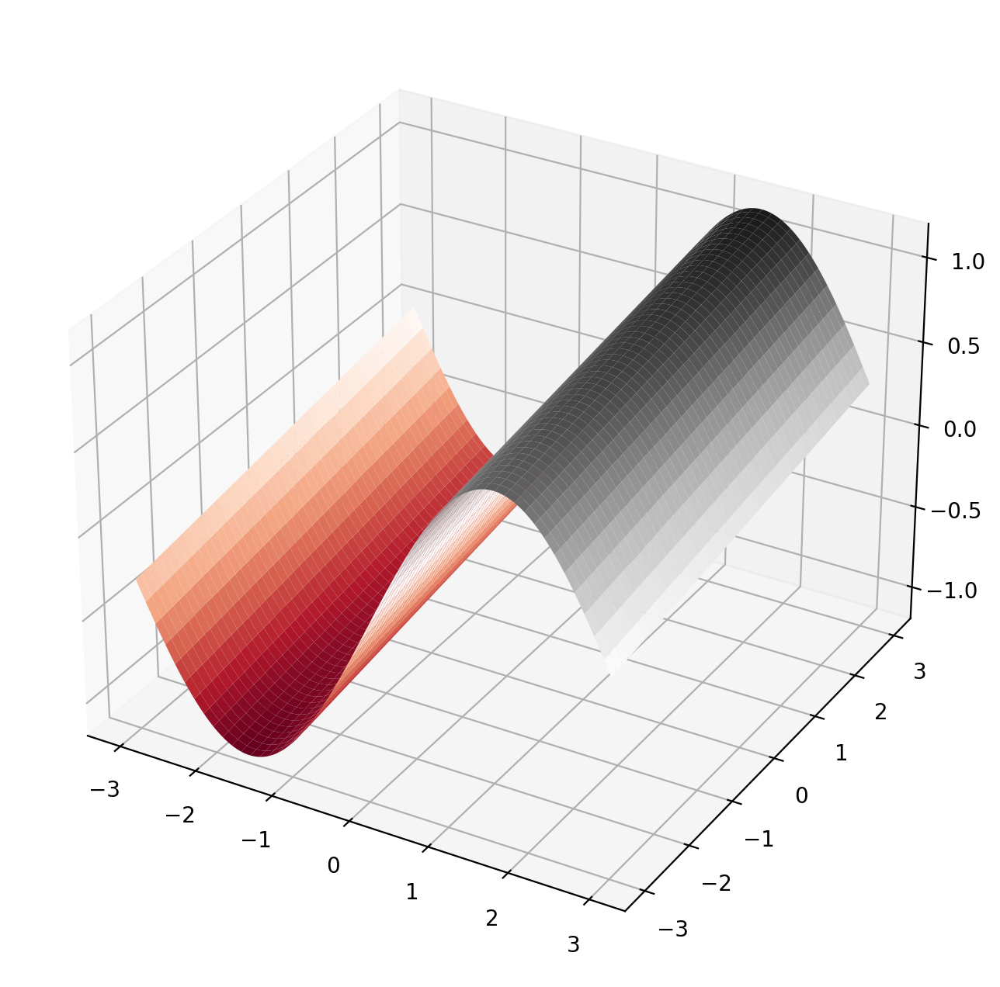

In [51]:
# True surface
intervals = 200
a = np.linspace(-3, 3, intervals)
b = np.linspace(-3, 3, intervals)

C,D = np.meshgrid(a,b)

cyd = np.vstack([C.ravel(), D.ravel()]).T

Z = np.sin(cyd[:,0])+ 0.05*(cyd[:,1])

Z = Z.reshape([intervals,intervals])

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(C, D, Z, cmap='RdGy')

In [52]:
# sample noisy training points
npoints = 50
X = np.random.uniform(-3.,3.,(npoints,2))
Y = np.sin(X[:,0:1]) + 0.05*X[:,1:2]+np.random.randn(npoints,1)*np.sqrt(0.01)


{'dataplot': [<matplotlib.collections.PathCollection at 0x780d19f7eea0>],
 'gpmean': [<matplotlib.contour.QuadContourSet at 0x780d19b64e90>]}

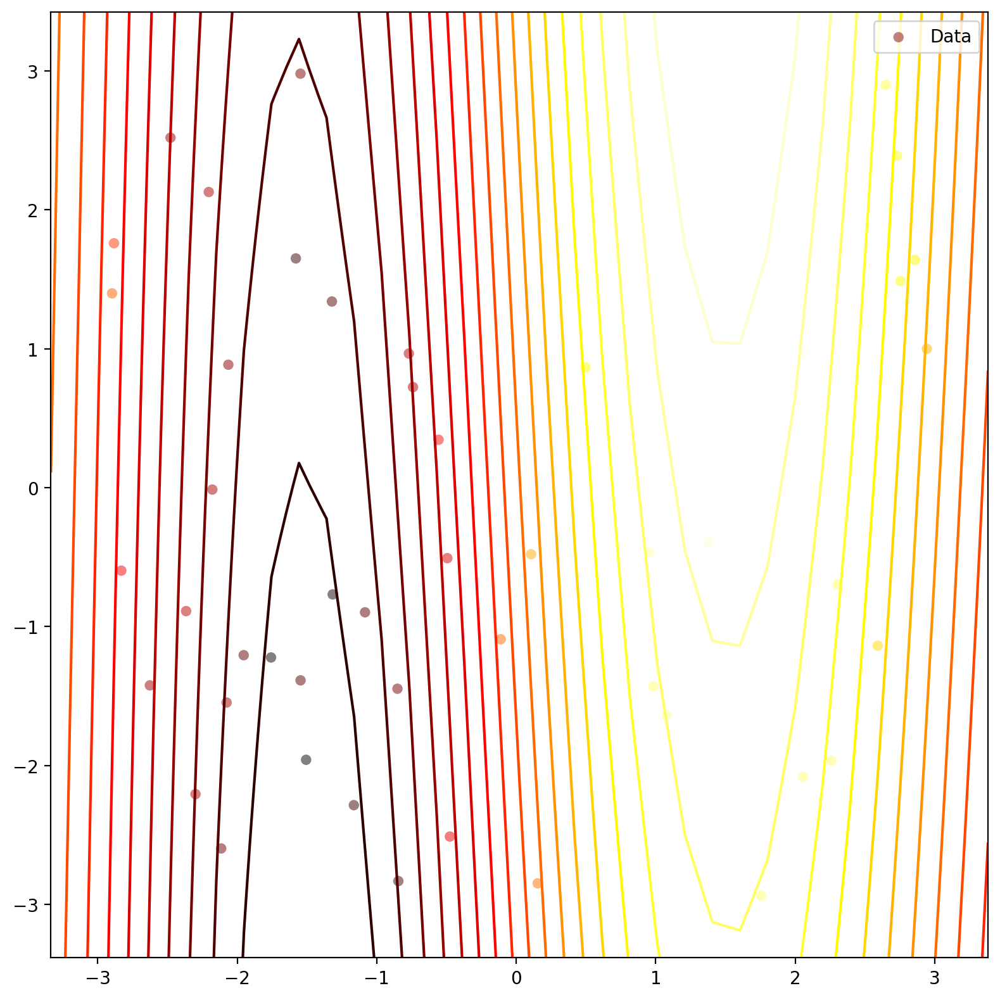

In [53]:
# define kernel
ker4 = GPy.kern.RBF(2,ARD=True) + GPy.kern.White(2)

# create simple GP model
m4 = GPy.models.GPRegression(X,Y,ker4)

# optimize and plot
m4.optimize(messages=True,max_f_eval = 1000)
m4.plot()


In [54]:
print(ker4.parameter_names())

print(ker4.rbf.variance.values)

print(ker4.rbf.lengthscale.values)

print(ker4.white.variance.values)

# a mas grande que sea la lenghtscalem menos importante que es la dimension

['rbf.variance', 'rbf.lengthscale', 'white.variance']
[0.81512821]
[ 1.73349923 23.33273616]
[0.0051114]


Note that the value of `lengthscale` corresponding to the second dimension is much higher!!!! As this parameter divides the variable, the higher the `lengthscale` value, the lower the importance of the variable.


## 4. Sparse regression with Gaussian processes

As we saw in the previous session, the major computational cost of a GP is given by the inversion of the kernel matrix (which requires a computational cost of $O(N^3)$ and in memory of $O(N^2)$). This implies that the use of these models on large databases is often intractable.

To reduce the computational complexity, sparse **GPs** arise, which propose to use a collection of $m$ **inducing points** -a set of points located in the
same input space-.
These inductor points aim to **summarize the features of the function using fewer points** than the training data.  Intuitively, the collection of all training points may contain a lot of redundancy, as many points may occur in regions of no interest.

Thus, sparse GPs use a subset of points to represent the GP solution and thus reduce its complexity, since during training we work on a few data and, moreover, the future prediction also does not depend on the entire data set. GPy also provides us with implementations of [sparse GPs](http://mlg.eng.cam.ac.uk/zoubin/papers/aistats07localGP.pdf).


Although we will not go into the technical details, with the following examples our goal is to show the effectiveness of the method and how to use it in practice.


Some references on sparse GPs:

- [James Hensman Leture at the 2013 Gaussian Process Summer School](https://www.youtube.com/watch?v=66vH34Ykfo0) (Video) y [transparencias](http://gpss.cc/gpss13/assets/Sheffield-GPSS2013-Hensman.pdf).
- [James Hensman Blog about Sparse GPs](https://www.prowler.io/blog/sparse-gps-approximate-the-posterior-not-the-model)



### A toy example using a generative model

For this problem we will use the generative model of our GP, for that we will define a GP and sample a function from its prior with which we will generate a set of observations.

To define the GP, we will consider an RBF covariance function with a length scale and variance of 1, we will include a noise with variance of $0.05$ and we will sample 50 equally spaced points.

In [ ]:
N = 50
noise_var = 0.05
np.random.seed(101)
X = np.linspace(0,10,50)[:,None]
k = GPy.kern.RBF(1)
# Generative model with noise
y = np.random.multivariate_normal(np.zeros(N),k.K(X)+np.eye(N)*np.sqrt(noise_var)).reshape(-1,1)

We can now use GPy to optimize the parameters of a Gaussian process given the data we have just generated. There are no approximations here, we simply fit the full Gaussian process (**non-sparse version**).

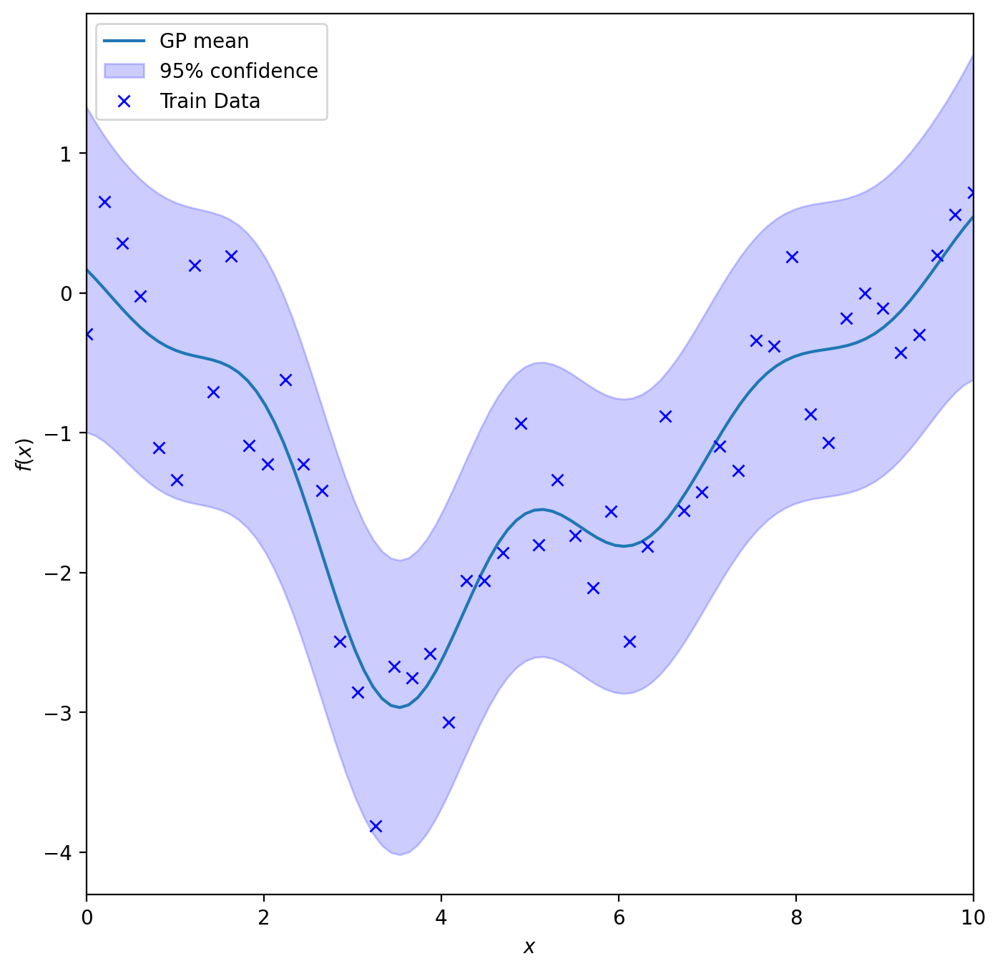


Name : GP regression
Objective : 50.11691792294765
Number of Parameters : 3
Number of Optimization Parameters : 3
Updates : True
Parameters:
  GP_regression.           |               value  |  constraints  |  priors
  rbf.variance             |  1.6316920345471557  |      +ve      |        
  rbf.lengthscale          |  1.1032687303390278  |      +ve      |        
  Gaussian_noise.variance  |  0.2364999109816966  |      +ve      |        


In [ ]:
m_full = GPy.models.GPRegression(X,y) # Default options
m_full.optimize('bfgs')
#m_full.plot()
plot_gp_model(m_full, plot_density=True)
print(m_full)

**A bad selection of inducing points**:

We will now learn a sparse Gaussian process. This model uses an approach based on generating a set of inducing points (which we can initialize ourselves) and adjusting them together with the model parameters. To simplify learning we will use the correct parameters of the covariance function, but we will initialize the inducing points in two misplaced regions.



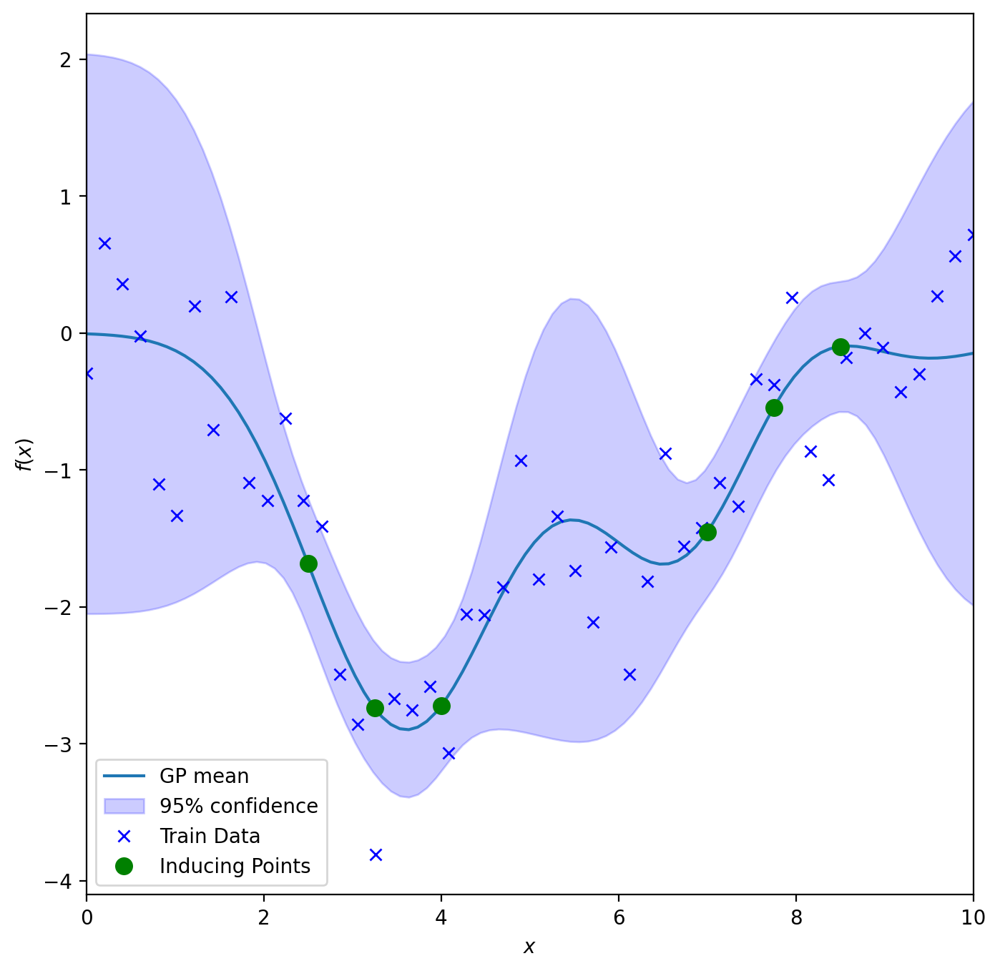


Name : sparse_gp
Objective : 260.92079394904
Number of Parameters : 9
Number of Optimization Parameters : 9
Updates : True
Parameters:
  sparse_gp.               |   value  |  constraints  |  priors
  inducing_inputs          |  (6, 1)  |               |        
  rbf.variance             |     1.0  |      +ve      |        
  rbf.lengthscale          |     1.0  |      +ve      |        
  Gaussian_noise.variance  |    0.05  |      +ve      |        


In [ ]:
# Define inducing points
Z = np.hstack((np.linspace(2.5,4.,3),np.linspace(7,8.5,3)))[:,None]
m = GPy.models.SparseGPRegression(X,y,Z=Z) # OJO!!! The model is SparseGPRegression!!!
# We force real noive_var
m.likelihood.variance = noise_var
#m.plot()
plot_gp_model(m, plot_density=True, plot_inducing=True)
print(m)

As we can see, the inductor points do not represent the whole space of observations, but **the model approximates the function quite well in the regions where there are inductor points, but poorly outside those regions.**

**Optimization of kernel parameters and noise**: Next, we will try to adjust the parameters of the covariance and noise function, and keep the inductor points at their current location.

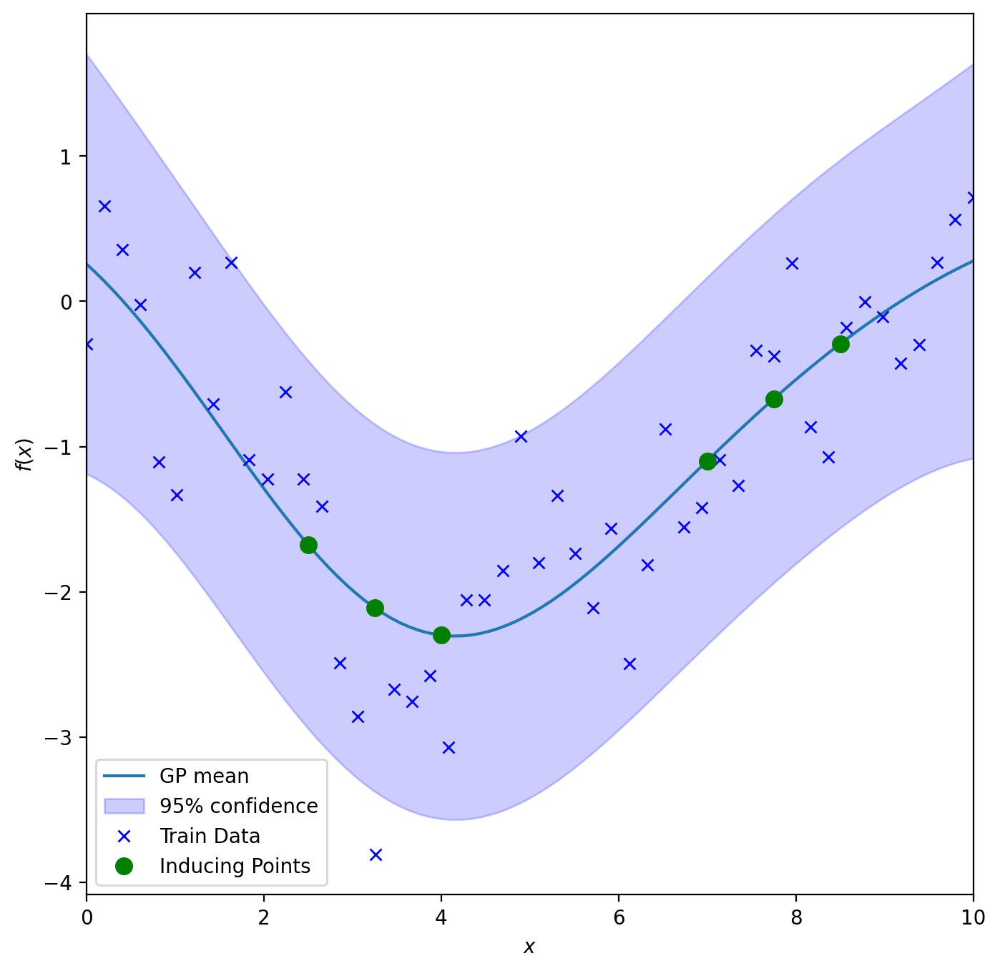


Name : sparse_gp
Objective : 54.02423365119728
Number of Parameters : 9
Number of Optimization Parameters : 3
Updates : True
Parameters:
  sparse_gp.               |                value  |  constraints  |  priors
  inducing_inputs          |               (6, 1)  |     fixed     |        
  rbf.variance             |   1.6852838809753174  |      +ve      |        
  rbf.lengthscale          |    2.972802274218143  |      +ve      |        
  Gaussian_noise.variance  |  0.37348007799932414  |      +ve      |        


In [ ]:
# Force that the inducing points are the ones that we have prefixed
m.inducing_inputs.fix()
m.optimize('bfgs')
#m.plot()
plot_gp_model(m, plot_density=True, plot_inducing=True)
print(m)

The poor location of the inductor points makes the model "not fit" to the data. The `lengthscale` of the kernel is significantly higher, and the variance of the noise is also higher. **This is due to the misplacement of the inductor points**.

**Optimization of the inductor points**: First, we try to optimize the location of the inductor points to solve the problem, however, we still get a longer length scale  than the Gaussian process we sampled (from the standard GP we trained at the beginning).

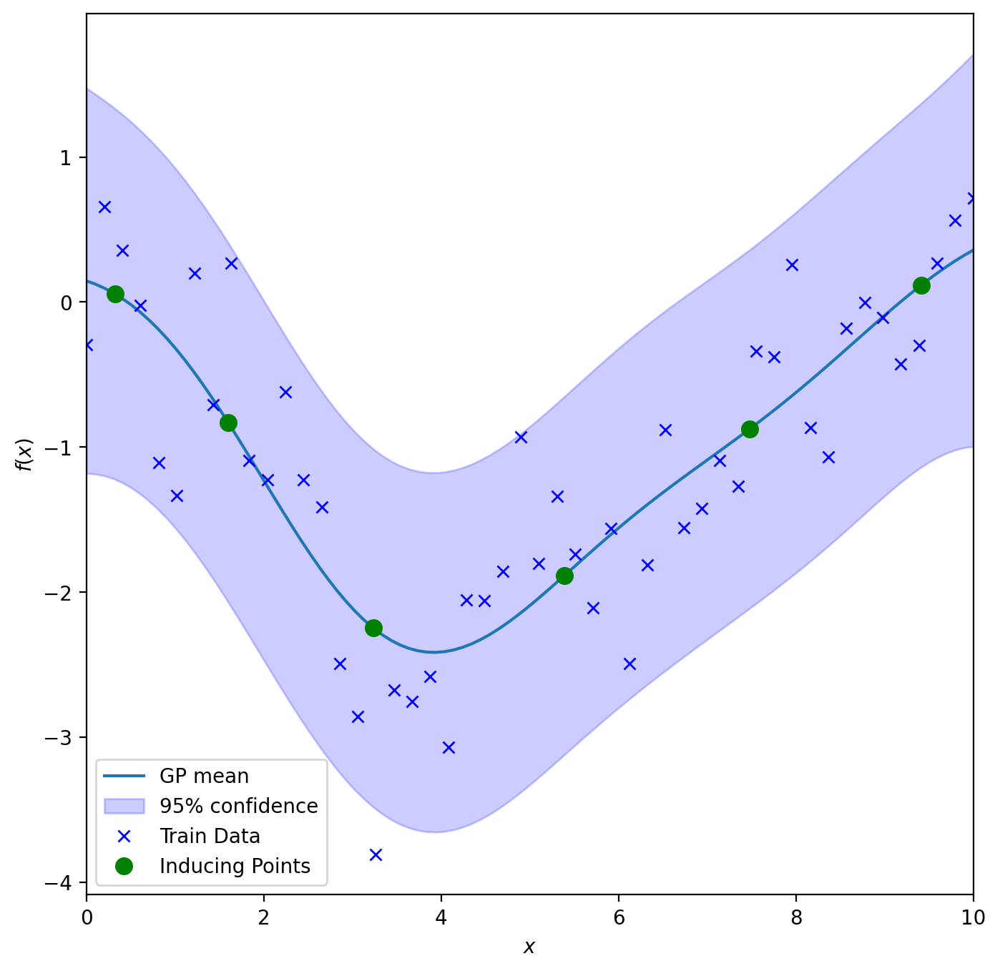


Name : sparse_gp
Objective : 53.40784706748079
Number of Parameters : 9
Number of Optimization Parameters : 9
Updates : True
Parameters:
  sparse_gp.               |               value  |  constraints  |  priors
  inducing_inputs          |              (6, 1)  |               |        
  rbf.variance             |  1.4288154154458197  |      +ve      |        
  rbf.lengthscale          |  2.1627429235665976  |      +ve      |        
  Gaussian_noise.variance  |  0.3500789310530024  |      +ve      |        


In [ ]:
m.randomize()
# Optimize the inducing points
m.Z.unconstrain()
m.optimize('bfgs')
#m.plot()
plot_gp_model(m, plot_density=True, plot_inducing=True)
print(m)

The inductor points are spread along the axis of observations to cover the data space, but the fit is not quite right. We can try to increase the number of inductor points.

**Training with more inductor points**: We now try using 12 inductor points, instead of the original six. We then compare with the predictive distribution of the full Gaussian process.

[[-50.14270865]] -50.11691792294765


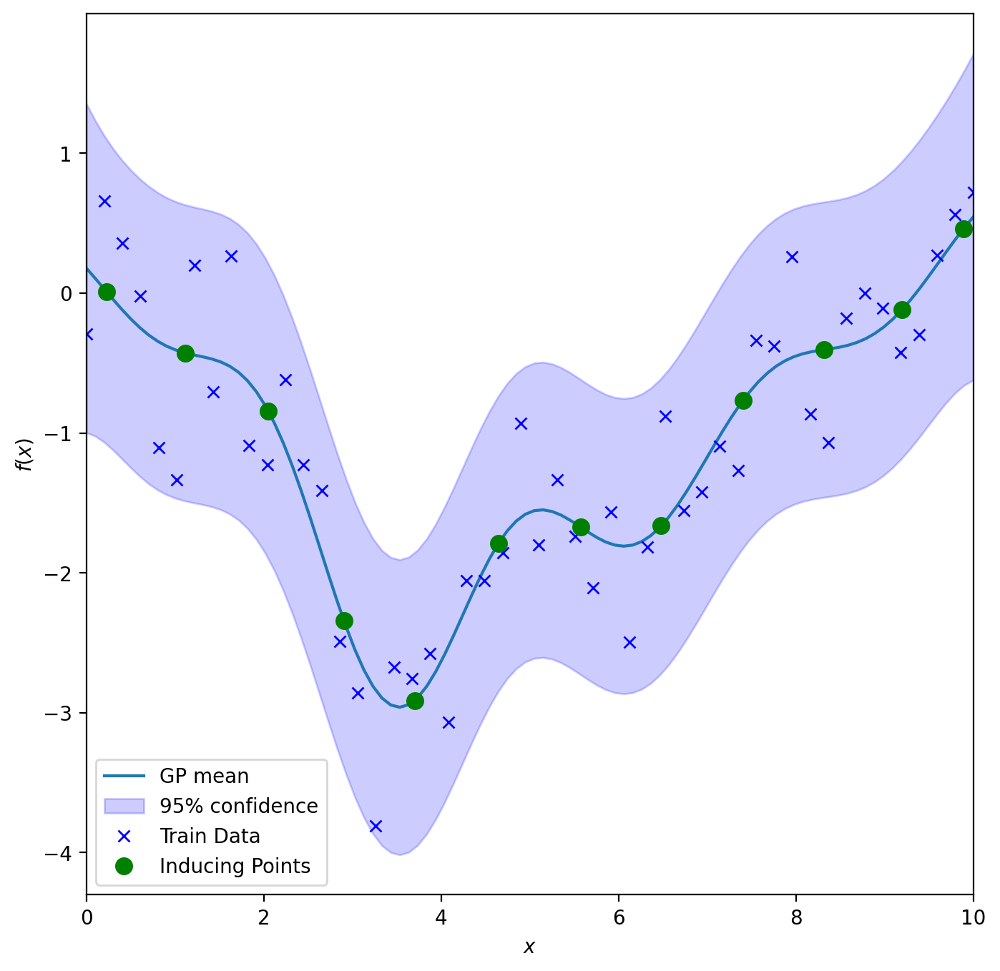

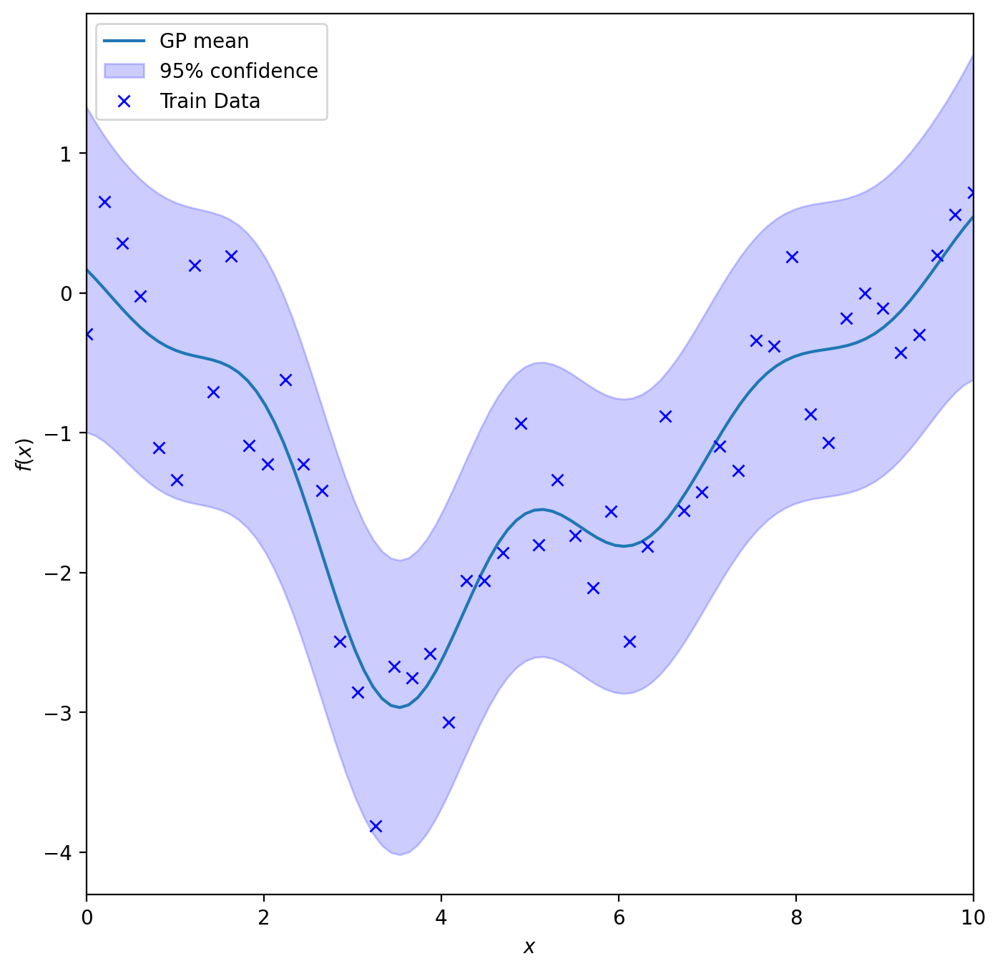

In [ ]:
Z = np.random.rand(12,1)*12
m = GPy.models.SparseGPRegression(X,y,Z=Z)

m.optimize('bfgs')
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m, plot_density=True, ax=ax, plot_inducing=True)
#m_full.plot()
fig, ax = plt.subplots(figsize=(8,8))
plot_gp_model(m_full, plot_density=True, ax=ax, plot_inducing=True)
print(m.log_likelihood(), m_full.log_likelihood())

This time, we have enough inductor points and the setting resembles that of the original GP.